In [1]:
pip install igraph

Note: you may need to restart the kernel to use updated packages.


In [ ]:
# use this code in the anaconda prompt, not in jupyter notebook
#conda install -c conda-forge python-annoy
#pip install bbknn

^C


In [2]:
pip install gseapy

     |████████████████████████████████| 1.5 MB 1.7 MB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 964 kB 3.4 MB/s eta 0:00:01
  Using cached grequests-0.6.0-py3-none-any.whl (5.2 kB)
     |████████████████████████████████| 47 kB 5.2 MB/s eta 0:00:01
  Using cached easydev-0.12.0-py3-none-any.whl
     |████████████████████████████████| 4.6 MB 4.0 MB/s eta 0:00:01
     |████████████████████████████████| 144 kB 4.9 MB/s eta 0:00:01
  Using cached appdirs-1.4.4-py2.py3-none-any.whl (9.6 kB)
  Using cached gevent-21.12.0-cp38-cp38-macosx_10_14_x86_64.whl (1.9 MB)
  Using cached zope.interface-5.4.0-cp38-cp38-macosx_10_14_x86_64.whl (208 kB)
     |████████████████████████████████| 93 kB 2.1 MB/s eta 0:00:011
  Using cached zope.event-4.5.0-py2.py3-none-any.whl (6.8 kB)
  Using cached url_normalize-1.4.3-py2.py3-none-any.whl (6.8 kB)
  ERROR: Command errored 

Note: you may need to restart the kernel to use updated packages.


In [1]:
import bbknn

In [2]:
import pandas as pd
import scanpy as sc
import numpy as np
from numpy import linalg as la
from scipy.sparse import issparse
import loompy
import anndata
import scvelo as scv
scv.logging.print_version()

Running scvelo 0.2.4 (python 3.9.12) on 2023-04-14 10:49.


In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80,dpi_save=300, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.8.0 pandas==1.4.2 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.10.4 louvain==0.7.1 pynndescent==0.5.6


In [4]:
import os
os.chdir('F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4')

In [5]:
import scanpy.external as sce

In [6]:
#import Group A immune dataset
# just concatenated data
adata_A = sc.read('F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4/GroupA/Group_A_patients_immune_pp_and_concatenated.h5ad')

In [7]:
#import Group B immune dataset
# just concatenated data
adata_B = sc.read('F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4/GroupB/Group_B_patients_immune_pp_and_concatenated.h5ad')

In [8]:
#import Group C immune dataset
# just concatenated data
adata_C = sc.read('F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4/GroupC/Group_C_patients_immune_pp_and_concatenated.h5ad')

In [9]:
adata_A.obs['patient']

AAACCTGAGTAGCCGA-1-0     P686
AAACCTGCAAGAGGCT-1-0     P686
AAACCTGCAGTATCTG-1-0     P686
AAACCTGCATGCCTTC-1-0     P686
AAACCTGGTGCCTGGT-1-0     P686
                         ... 
TTTGTCAAGCAATATG-1-21    P022
TTTGTCACAGTCAGAG-1-21    P022
TTTGTCAGTGACCAAG-1-21    P022
TTTGTCATCACGACTA-1-21    P022
TTTGTCATCTGGGCCA-1-21    P022
Name: patient, Length: 51330, dtype: category
Categories (21, object): ['P009A', 'P022', 'P036', 'P038', ..., 'P865', 'P866', 'P944', 'P986']

In [10]:
adata_B.obs['patient']

AAACCTGAGAAACCTA-1-0     P836
AAACCTGAGTTCGCAT-1-0     P836
AAACCTGCAGACGCCT-1-0     P836
AAACCTGTCGGTTCGG-1-0     P836
AAACGGGAGCCAGTTT-1-0     P836
                         ... 
TTTGGTTTCACCTTAT-1-23    P076
TTTGGTTTCGCCGTGA-1-23    P076
TTTGGTTTCTCGCATC-1-23    P076
TTTGTCAAGTGTGAAT-1-23    P076
TTTGTCAGTAGAGGAA-1-23    P076
Name: patient, Length: 72717, dtype: category
Categories (23, object): ['P002', 'P012', 'P016', 'P026', ..., 'P127', 'P128', 'P836', 'P846']

In [11]:
adata_C.obs['patient']

AAACCTGAGACACGAC-1-0     P130
AAACCTGAGCATGGCA-1-0     P130
AAACCTGAGGCCCGTT-1-0     P130
AAACCTGCAATCCAAC-1-0     P130
AAACGGGAGAAACGCC-1-0     P130
                         ... 
TTTGGTTTCTTGGGTA-1-24    P001
TTTGTCAAGCGCTTAT-1-24    P001
TTTGTCAGTCCTCTTG-1-24    P001
TTTGTCAGTCTCTTTA-1-24    P001
TTTGTCAGTTACGGAG-1-24    P001
Name: patient, Length: 65312, dtype: category
Categories (25, object): ['P001', 'P008', 'P009B', 'P010', ..., 'P084', 'P091', 'P094', 'P130']

In [12]:
adata_ABC = adata_A.concatenate(adata_B,adata_C)

In [14]:
adata_ABC.obs.leiden = adata_ABC.obs.leiden.astype('category')


In [15]:
adata_ABC.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,leiden,batch
AAACCTGAGTAGCCGA-1-0-0,3934.0,3933,20206.0,476.0,2.355736,tumor,P686,10,0
AAACCTGCAAGAGGCT-1-0-0,674.0,674,1908.0,21.0,1.100629,tumor,P686,1,0
AAACCTGCAGTATCTG-1-0-0,1014.0,1014,3701.0,85.0,2.296676,tumor,P686,1,0
AAACCTGCATGCCTTC-1-0-0,2607.0,2601,12573.0,454.0,3.610912,tumor,P686,13,0
AAACCTGGTGCCTGGT-1-0-0,896.0,895,1963.0,40.0,2.037698,tumor,P686,6,0
...,...,...,...,...,...,...,...,...,...
TTTGGTTTCTTGGGTA-1-24-2,665.0,665,940.0,48.0,5.106383,tumor,P001,NaN,2
TTTGTCAAGCGCTTAT-1-24-2,248.0,247,518.0,6.0,1.158301,tumor,P001,NaN,2
TTTGTCAGTCCTCTTG-1-24-2,2711.0,2710,5762.0,144.0,2.499132,tumor,P001,NaN,2
TTTGTCAGTCTCTTTA-1-24-2,1890.0,1887,4323.0,15.0,0.346981,tumor,P001,NaN,2


In [16]:
#adata_A.obs.louvain.cat.reorder_categories(adata_ref.obs.louvain.cat.categories, inplace=True)  # fix category ordering

In [18]:
sc.tl.pca(adata_ABC)

computing PCA
    with n_comps=50
    finished (0:02:15)


In [19]:
adata_ABC

AnnData object with n_obs × n_vars = 189359 × 12515
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'leiden', 'batch'
    var: 'gene_ids', 'mt', 'feature_types-10', 'feature_types-11', 'feature_types-12', 'feature_types-13', 'feature_types-14', 'feature_types-15', 'feature_types-16', 'feature_types-17', 'feature_types-18', 'feature_types-19', 'feature_types-20', 'feature_types-21', 'feature_types-3', 'feature_types-4', 'feature_types-5', 'feature_types-6', 'feature_types-7', 'feature_types-8', 'feature_types-9', 'feature_types-0', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'n_cells-1-0', 'n_cells_by_counts-1-0', 'mean_counts-1-0', 'pct_dropout_by_counts-1-0', 'total_counts-1-0', 'n_cells-10-0', 'n_cells_by_counts-10-0', 'mean_counts-10-0', 'pct_dropout_by_counts-10-0', 'total_counts-10-0', 'n_cells-11-0', 'n_cells_by_counts-11-0', 'mean_counts-11-0', 'pct_d

In [20]:
import scanpy as sc
import scanpy.external as sce

In [21]:
adata_ABC.obs['batch']

AAACCTGAGTAGCCGA-1-0-0     0
AAACCTGCAAGAGGCT-1-0-0     0
AAACCTGCAGTATCTG-1-0-0     0
AAACCTGCATGCCTTC-1-0-0     0
AAACCTGGTGCCTGGT-1-0-0     0
                          ..
TTTGGTTTCTTGGGTA-1-24-2    2
TTTGTCAAGCGCTTAT-1-24-2    2
TTTGTCAGTCCTCTTG-1-24-2    2
TTTGTCAGTCTCTTTA-1-24-2    2
TTTGTCAGTTACGGAG-1-24-2    2
Name: batch, Length: 189359, dtype: category
Categories (3, object): ['0', '1', '2']

In [22]:
#adata_concat.obs['batch'] = 20273*['11Patients'] + 118980*['56patients']

In [23]:
#adata_concat.obs['tissue'] =='tumor'

In [24]:
adata_ABC.obs['tissue']

AAACCTGAGTAGCCGA-1-0-0     tumor
AAACCTGCAAGAGGCT-1-0-0     tumor
AAACCTGCAGTATCTG-1-0-0     tumor
AAACCTGCATGCCTTC-1-0-0     tumor
AAACCTGGTGCCTGGT-1-0-0     tumor
                           ...  
TTTGGTTTCTTGGGTA-1-24-2    tumor
TTTGTCAAGCGCTTAT-1-24-2    tumor
TTTGTCAGTCCTCTTG-1-24-2    tumor
TTTGTCAGTCTCTTTA-1-24-2    tumor
TTTGTCAGTTACGGAG-1-24-2    tumor
Name: tissue, Length: 189359, dtype: category
Categories (1, object): ['tumor']

In [25]:
#pip install harmonypy

In [26]:
#sce.pp.harmony_integrate(adata_concat, 'batch')
#'X_pca_harmony' in adata_concat.obsm
#True

In [27]:
sc.pp.neighbors(adata_ABC)
#sc.tl.umap(adata_concat)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:41)


In [28]:
#sc.pl.umap(adata_concat, color=['batch', 'louvain'])

In [29]:
#sc.pl.umap(adata_concat, color=['batch', 'louvain'])

In [30]:
#adata_concat.write('11P_56P_without_PCN_before_harmony.h5ad', compression='gzip')

In [31]:
adata = adata_ABC

In [32]:
adata

AnnData object with n_obs × n_vars = 189359 × 12515
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'leiden', 'batch'
    var: 'gene_ids', 'mt', 'feature_types-10', 'feature_types-11', 'feature_types-12', 'feature_types-13', 'feature_types-14', 'feature_types-15', 'feature_types-16', 'feature_types-17', 'feature_types-18', 'feature_types-19', 'feature_types-20', 'feature_types-21', 'feature_types-3', 'feature_types-4', 'feature_types-5', 'feature_types-6', 'feature_types-7', 'feature_types-8', 'feature_types-9', 'feature_types-0', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'n_cells-1-0', 'n_cells_by_counts-1-0', 'mean_counts-1-0', 'pct_dropout_by_counts-1-0', 'total_counts-1-0', 'n_cells-10-0', 'n_cells_by_counts-10-0', 'mean_counts-10-0', 'pct_dropout_by_counts-10-0', 'total_counts-10-0', 'n_cells-11-0', 'n_cells_by_counts-11-0', 'mean_counts-11-0', 'pct_d

In [33]:
# mitochondrial genes
adata.var['mt'] = adata.var_names.str.startswith('MT-') 
# ribosomal genes
adata.var['ribo'] = adata.var_names.str.startswith(("RPS","RPL"))
# hemoglobin genes.
adata.var['hb'] = adata.var_names.str.contains(("^HB[^(P)]"))

adata.var

,gene_ids,mt,feature_types-10,feature_types-11,feature_types-12,feature_types-13,feature_types-14,feature_types-15,feature_types-16,feature_types-17,...,pct_dropout_by_counts-23-2,total_counts-23-2,feature_types-24-2,n_cells-24-2,n_cells_by_counts-24-2,mean_counts-24-2,pct_dropout_by_counts-24-2,total_counts-24-2,ribo,hb
LINC01409,ENSG00000237491,False,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,...,97.624398,76.0,Gene Expression,66,66,0.023695,97.886647,74.0,False,False
LINC01128,ENSG00000228794,False,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,...,92.391653,264.0,Gene Expression,247,247,0.100544,92.090938,314.0,False,False
LINC00115,ENSG00000225880,False,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,...,97.977528,63.0,Gene Expression,64,64,0.021134,97.950688,66.0,False,False
NOC2L,ENSG00000188976,False,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,...,82.311396,638.0,Gene Expression,442,442,0.171630,85.846942,536.0,False,False
KLHL17,ENSG00000187961,False,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,...,99.486356,16.0,Gene Expression,23,23,0.007685,99.263529,24.0,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-ND5,ENSG00000198786,True,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,...,5.810594,22026.0,Gene Expression,2720,2720,5.393852,12.904259,16845.0,False,False
MT-ND6,ENSG00000198695,True,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,...,45.264848,3926.0,Gene Expression,1296,1296,1.055716,58.501441,3297.0,False,False
MT-CYB,ENSG00000198727,True,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,...,3.081862,48523.0,Gene Expression,2861,2861,12.573807,8.389369,39268.0,False,False
AC011043.1,ENSG00000276256,False,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,...,99.357945,20.0,Gene Expression,31,31,0.010567,99.007365,33.0,False,False


In [34]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo','hb'], percent_top=None, log1p=False, inplace=True)

In [35]:
mito_genes = adata.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mt2'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

In [36]:
adata

AnnData object with n_obs × n_vars = 189359 × 12515
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'leiden', 'batch', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts'
    var: 'gene_ids', 'mt', 'feature_types-10', 'feature_types-11', 'feature_types-12', 'feature_types-13', 'feature_types-14', 'feature_types-15', 'feature_types-16', 'feature_types-17', 'feature_types-18', 'feature_types-19', 'feature_types-20', 'feature_types-21', 'feature_types-3', 'feature_types-4', 'feature_types-5', 'feature_types-6', 'feature_types-7', 'feature_types-8', 'feature_types-9', 'feature_types-0', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'n_cells-1-0', 'n_cells_by_counts-1-0', 'mean_counts-1-0', 'pct_dropout_by_counts-1-0', 'total_counts-1-0', 'n_cells-10-0', 'n_cells_by_counts-10-0', 'mean_counts-10-0', 'pct_dropout_by_

In [37]:
# filter for percent mito
adata = adata[adata.obs['pct_counts_mt'] < 20, :]

# filter for percent ribo > 0.05
adata = adata[adata.obs['pct_counts_ribo'] > 5, :]

print("Remaining cells %d"%adata.n_obs)

Remaining cells 177304


In [38]:
malat1 = adata.var_names.str.startswith('MALAT1')
# we need to redefine the mito_genes since they were first 
# calculated on the full object before removing low expressed genes.
mito_genes = adata.var_names.str.startswith('MT-')
hb_genes = adata.var_names.str.contains('^HB[^(P)]')

remove = np.add(mito_genes, malat1)
remove = np.add(remove, hb_genes)
keep = np.invert(remove)

adata = adata[:,keep]

print(adata.n_obs, adata.n_vars)

177304 12499


In [39]:
adata.raw = adata

In [40]:
adata.raw

In [41]:
#sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
#adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)
sc.tl.leiden(adata)
sc.tl.umap(adata)

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (1:23:10)
computing PCA
    with n_comps=50
    finished (0:03:21)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)
running Leiden clustering
    finished: found 31 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:37)


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_patient']`


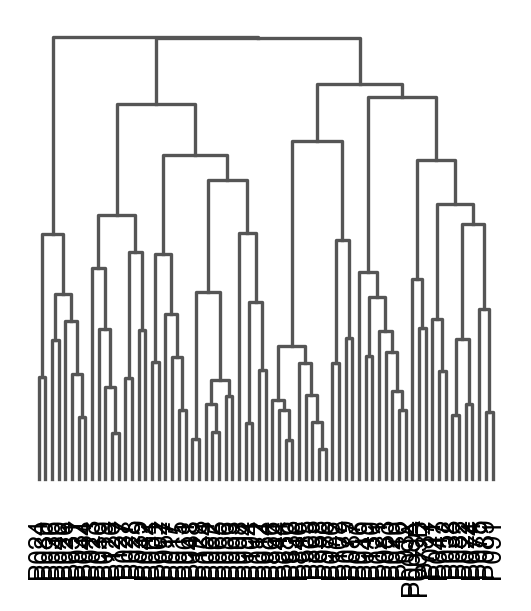

<AxesSubplot:>

In [42]:
# dendrogram after converting mouse gene to human gene
sc.tl.dendrogram(adata, 'patient')
sc.pl.dendrogram(adata, 'patient')

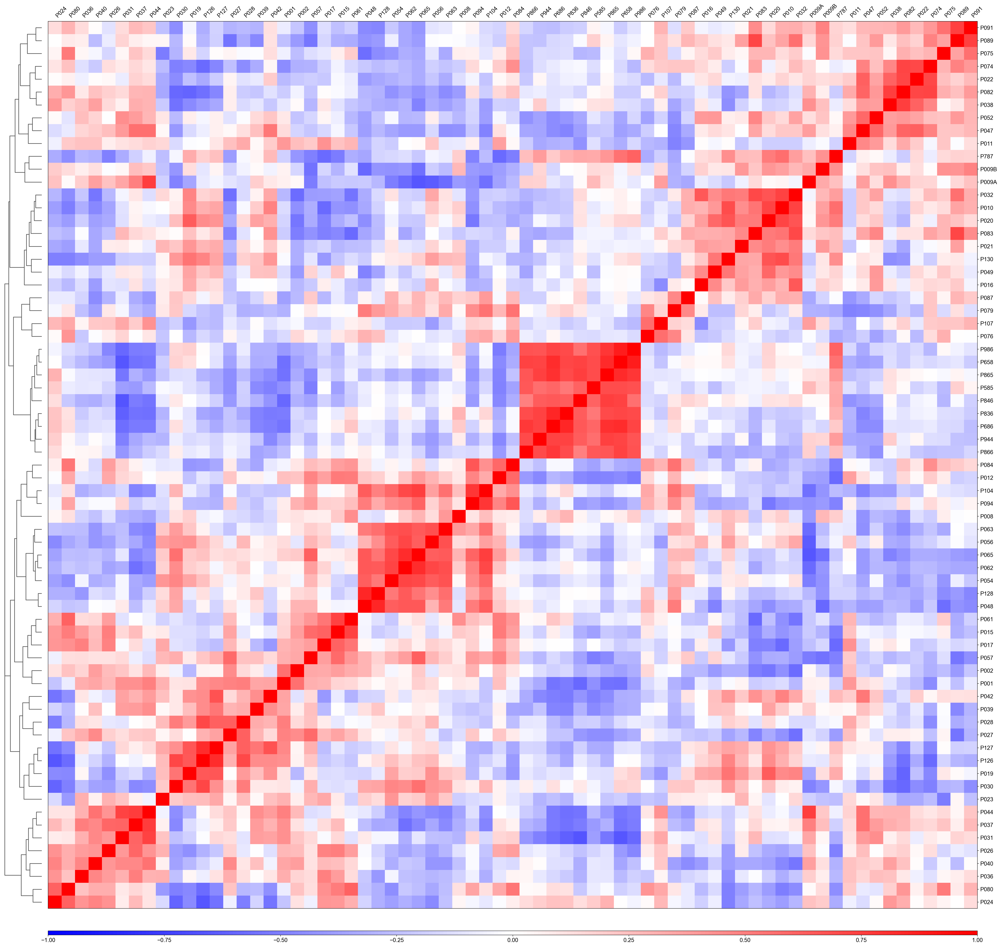

In [43]:
sc.pl.correlation_matrix(adata, groupby='patient')

In [44]:
adata

AnnData object with n_obs × n_vars = 177304 × 12499
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'leiden', 'batch', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts'
    var: 'gene_ids', 'mt', 'feature_types-10', 'feature_types-11', 'feature_types-12', 'feature_types-13', 'feature_types-14', 'feature_types-15', 'feature_types-16', 'feature_types-17', 'feature_types-18', 'feature_types-19', 'feature_types-20', 'feature_types-21', 'feature_types-3', 'feature_types-4', 'feature_types-5', 'feature_types-6', 'feature_types-7', 'feature_types-8', 'feature_types-9', 'feature_types-0', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'n_cells-1-0', 'n_cells_by_counts-1-0', 'mean_counts-1-0', 'pct_dropout_by_counts-1-0', 'total_counts-1-0', 'n_cells-10-0', 'n_cells_by_counts-10-0', 'mean_counts-10-0', 'pct_dropout_by_

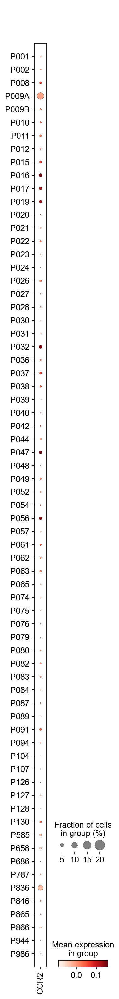

In [45]:
sc.pl.dotplot(adata, ['CCR2'], groupby='patient', use_raw=False)

In [46]:
#previous data (not sorted 1~11)
#sc.pl.dotplot(adata, ['CCR2'], groupby='patient', use_raw=False)

In [47]:
#############################################################
############ Harmony batch correction #######################
#############################################################

sce.pp.harmony_integrate(adata, 'batch')
'X_pca_harmony' in adata.obsm
True

2023-04-12 19:10:44,402 - harmonypy - INFO - Iteration 1 of 10
2023-04-12 19:12:58,449 - harmonypy - INFO - Iteration 2 of 10
2023-04-12 19:15:11,182 - harmonypy - INFO - Iteration 3 of 10
2023-04-12 19:17:24,935 - harmonypy - INFO - Converged after 3 iterations


True

In [48]:
adata.obsm['X_pca'] = adata.obsm['X_pca_harmony']
sc.pp.neighbors(adata)
sc.tl.pca(adata)
sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:13)
computing PCA
    with n_comps=50
    finished (0:03:41)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:06)


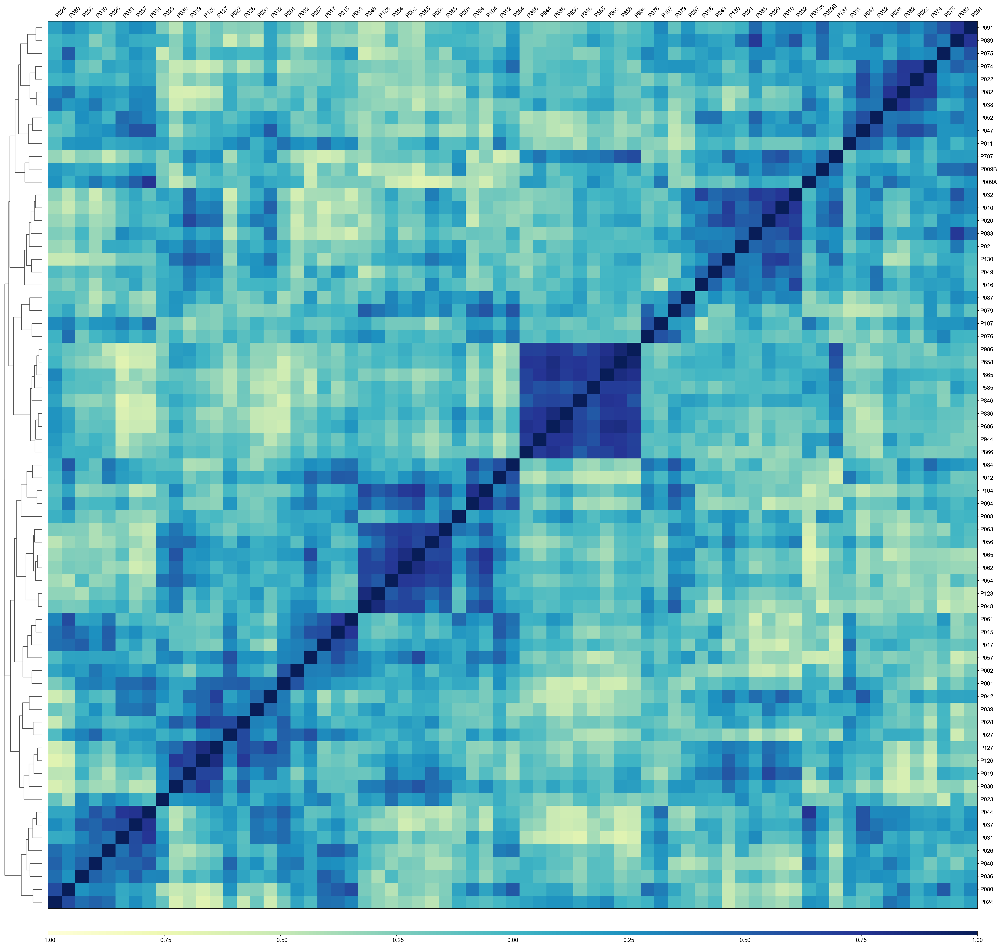

In [49]:
sc.pl.correlation_matrix(adata, groupby='patient',cmap='YlGnBu', save='_immune_GroupABC_correlation_matrix.pdf')

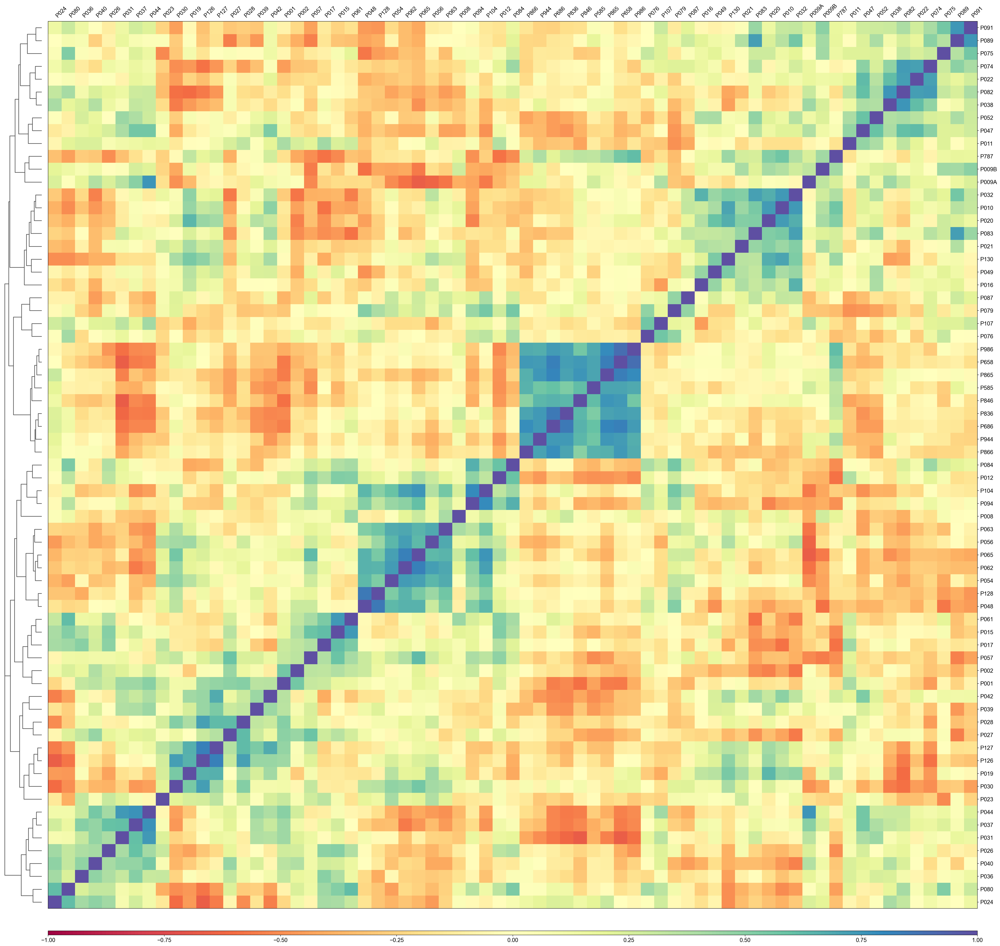

In [50]:
sc.pl.correlation_matrix(adata, groupby='patient',cmap='Spectral') #save='_immune_GroupABC_correlation_matrix.pdf')

In [51]:
#sc.pl.umap(adata, color=['patient'], save='umap_Group_A_patient_immune-modified.pdf')

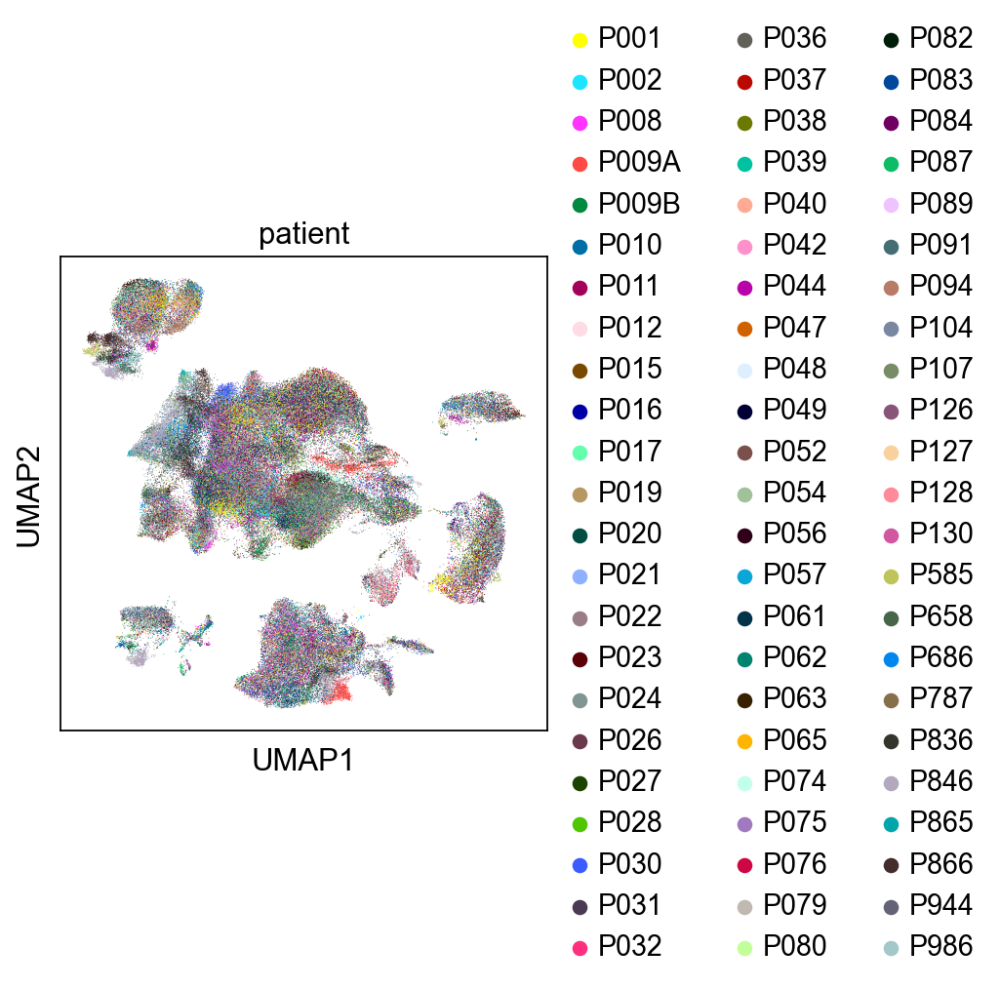

In [52]:
sc.pl.umap(adata, color=['patient'], save='umap_Group_ABC_patient_immune-modified.pdf')

In [53]:
#sc.pl.umap(adata, color=['patient'], save='umap_Group_A_patient_immune.pdf')

In [54]:
adata.write('Group_ABC_patients_immune_after_harmony.h5ad')

In [7]:
adata = sc.read('Group_ABC_patients_immune_after_harmony.h5ad')

In [55]:
adata.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,leiden,batch,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts
AAACCTGAGTAGCCGA-1-0-0,3934.0,3879,1452.073242,18.802568,1.294877,tumor,P686,6,0,198.197769,13.649295,0.000000,0.000000,0.012949,1452.073242
AAACCTGCAAGAGGCT-1-0-0,674.0,669,882.995728,11.229170,1.271713,tumor,P686,6,0,213.666718,24.197933,0.000000,0.000000,0.012717,882.995728
AAACCTGCAGTATCTG-1-0-0,1014.0,1003,956.411804,18.788149,1.964441,tumor,P686,6,0,221.148575,23.122736,0.000000,0.000000,0.019644,956.411804
AAACCTGCATGCCTTC-1-0-0,2607.0,2556,1262.646240,23.060396,1.826355,tumor,P686,14,0,161.333832,12.777437,0.000000,0.000000,0.018264,1262.646240
AAACCTGGTGCCTGGT-1-0-0,896.0,885,1091.559448,17.238060,1.579214,tumor,P686,6,0,176.360626,16.156759,0.000000,0.000000,0.015792,1091.559448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTCAAGCCATT-1-24-2,4456.0,4328,1867.209229,29.546848,1.582407,tumor,P001,0,2,172.502136,9.238501,0.172559,0.009242,0.015824,1867.209229
TTTGGTTGTCACCCAG-1-24-2,689.0,642,487.017822,17.679008,3.630054,tumor,P001,5,2,59.435638,12.203997,0.000000,0.000000,0.036301,487.017822
TTTGTCAAGCGCTTAT-1-24-2,248.0,235,523.794067,8.050291,1.536919,tumor,P001,5,2,57.140697,10.909000,0.000000,0.000000,0.015369,523.794067
TTTGTCAGTCCTCTTG-1-24-2,2711.0,2644,1972.602417,24.433256,1.238631,tumor,P001,10,2,120.637726,6.115664,0.000000,0.000000,0.012386,1972.602417


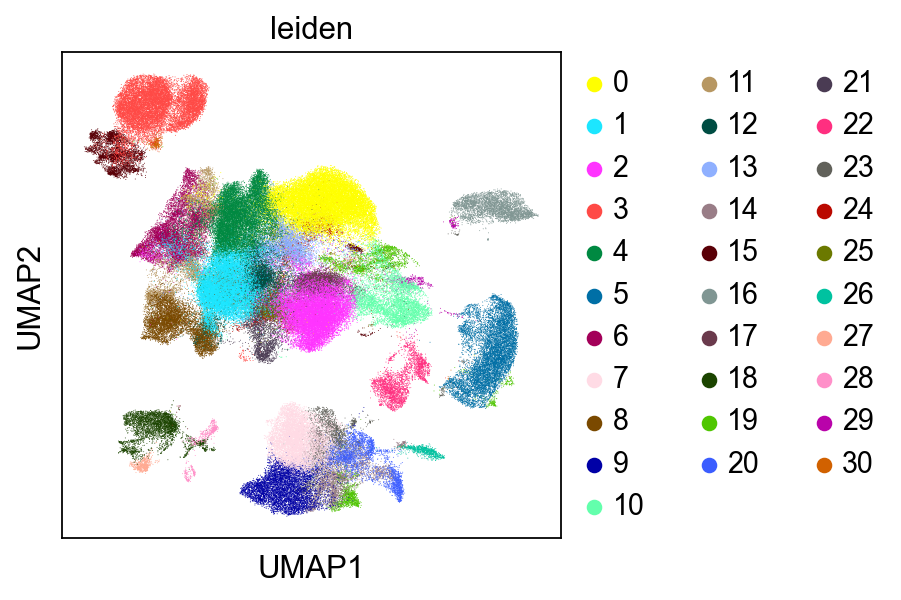

In [56]:
sc.pl.umap(adata, color=['leiden'], save='umap_Group_ABC_louvain-modified.pdf')

In [57]:
#sc.pl.umap(adata, color=['leiden'], save='umap_Group_A_leiden.pdf')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:11:29)


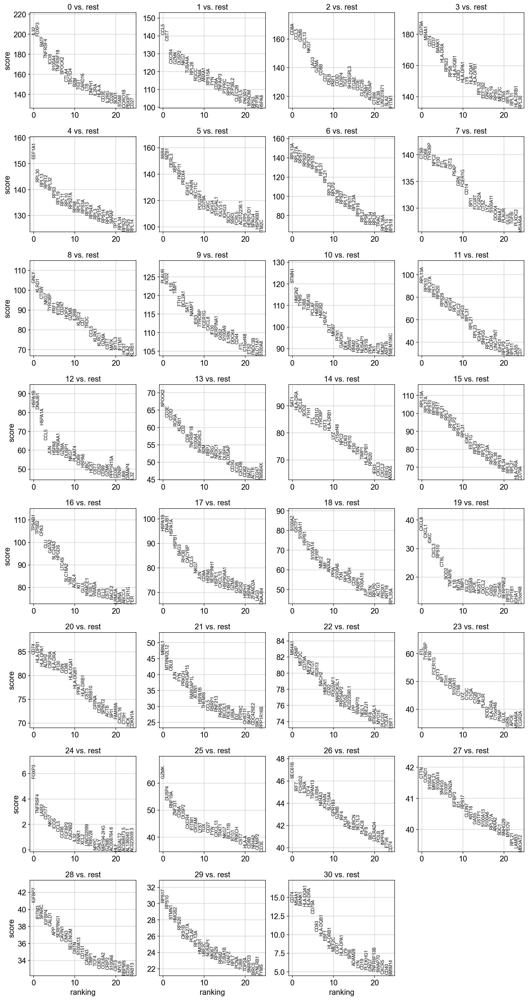

In [58]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [59]:
df=pd.DataFrame(adata.uns['rank_genes_groups']['names'])
df.to_csv("F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4/Group_ABC_patient_cluster_markergene_04-12-23.csv",
                 sep=',', na_rep='', float_format=None, columns=None, header=True, 
                 index=True, index_label=None, mode='w', encoding=None, compression='infer', 
                 quoting=None, quotechar='"', line_terminator=None, chunksize=None, date_format=None)

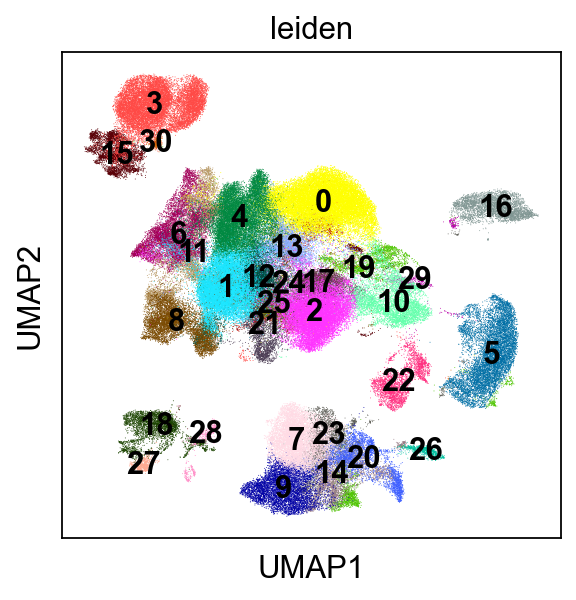

In [60]:
sc.pl.umap(adata, color=['leiden'],legend_loc='on data')

In [61]:
adata.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,leiden,batch,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts
AAACCTGAGTAGCCGA-1-0-0,3934.0,3879,1452.073242,18.802568,1.294877,tumor,P686,6,0,198.197769,13.649295,0.000000,0.000000,0.012949,1452.073242
AAACCTGCAAGAGGCT-1-0-0,674.0,669,882.995728,11.229170,1.271713,tumor,P686,6,0,213.666718,24.197933,0.000000,0.000000,0.012717,882.995728
AAACCTGCAGTATCTG-1-0-0,1014.0,1003,956.411804,18.788149,1.964441,tumor,P686,6,0,221.148575,23.122736,0.000000,0.000000,0.019644,956.411804
AAACCTGCATGCCTTC-1-0-0,2607.0,2556,1262.646240,23.060396,1.826355,tumor,P686,14,0,161.333832,12.777437,0.000000,0.000000,0.018264,1262.646240
AAACCTGGTGCCTGGT-1-0-0,896.0,885,1091.559448,17.238060,1.579214,tumor,P686,6,0,176.360626,16.156759,0.000000,0.000000,0.015792,1091.559448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTCAAGCCATT-1-24-2,4456.0,4328,1867.209229,29.546848,1.582407,tumor,P001,0,2,172.502136,9.238501,0.172559,0.009242,0.015824,1867.209229
TTTGGTTGTCACCCAG-1-24-2,689.0,642,487.017822,17.679008,3.630054,tumor,P001,5,2,59.435638,12.203997,0.000000,0.000000,0.036301,487.017822
TTTGTCAAGCGCTTAT-1-24-2,248.0,235,523.794067,8.050291,1.536919,tumor,P001,5,2,57.140697,10.909000,0.000000,0.000000,0.015369,523.794067
TTTGTCAGTCCTCTTG-1-24-2,2711.0,2644,1972.602417,24.433256,1.238631,tumor,P001,10,2,120.637726,6.115664,0.000000,0.000000,0.012386,1972.602417


In [62]:
pd.crosstab(adata.obs['patient'], adata.obs['patient'])
#df = pd.crosstab(adata.obs['batch'], adata.obs['patient'])
#df.to_csv('bach_patinet_number.csv')

patient,P001,P002,P008,P009A,P009B,P010,P011,P012,P015,P016,...,P585,P658,P686,P787,P836,P846,P865,P866,P944,P986
patient,,,,,,,,,,,,,,,,,,,,,
P001,2513,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
P002,0,4793,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
P008,0,0,3513,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
P009A,0,0,0,2154,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
P009B,0,0,0,0,4592,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P846,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,4485,0,0,0,0
P865,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1474,0,0,0
P866,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,5168,0,0


# checked

In [63]:
adata.obs['leiden'].cat.reorder_categories(['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15',
                          '16','17','18','19','20','21','22','23','24','25','26','27','28','29','30'],inplace=True)
adata.obs['leiden']

AAACCTGAGTAGCCGA-1-0-0      6
AAACCTGCAAGAGGCT-1-0-0      6
AAACCTGCAGTATCTG-1-0-0      6
AAACCTGCATGCCTTC-1-0-0     14
AAACCTGGTGCCTGGT-1-0-0      6
                           ..
TTTGGTTCAAGCCATT-1-24-2     0
TTTGGTTGTCACCCAG-1-24-2     5
TTTGTCAAGCGCTTAT-1-24-2     5
TTTGTCAGTCCTCTTG-1-24-2    10
TTTGTCAGTCTCTTTA-1-24-2     4
Name: leiden, Length: 177304, dtype: category
Categories (31, object): ['0', '1', '2', '3', ..., '27', '28', '29', '30']

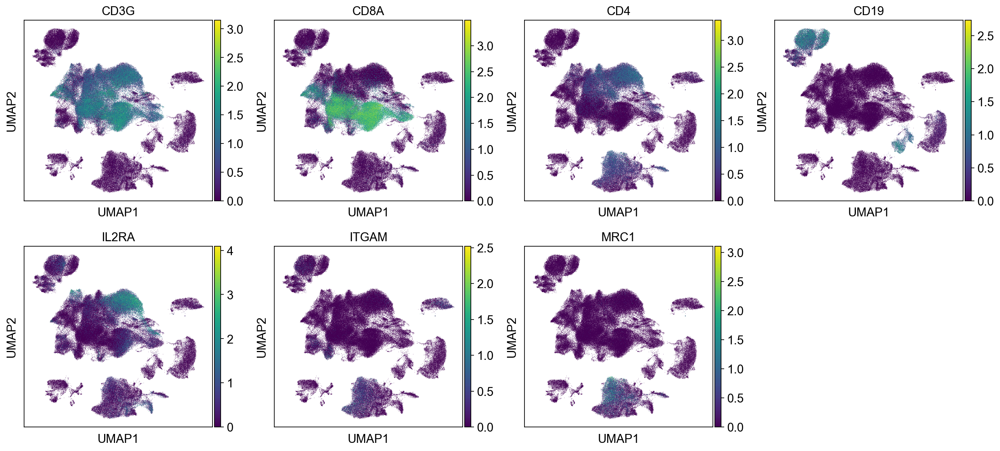

In [64]:
# T cell marker: 'CD3G','CD8A','CD4'
# B cell marker: 'CD19'
# Myeloid cell marker: 'ITGAM','MRC1'
sc.pl.umap(adata, color=['CD3G','CD8A','CD4','CD19','IL2RA','ITGAM','MRC1'])

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


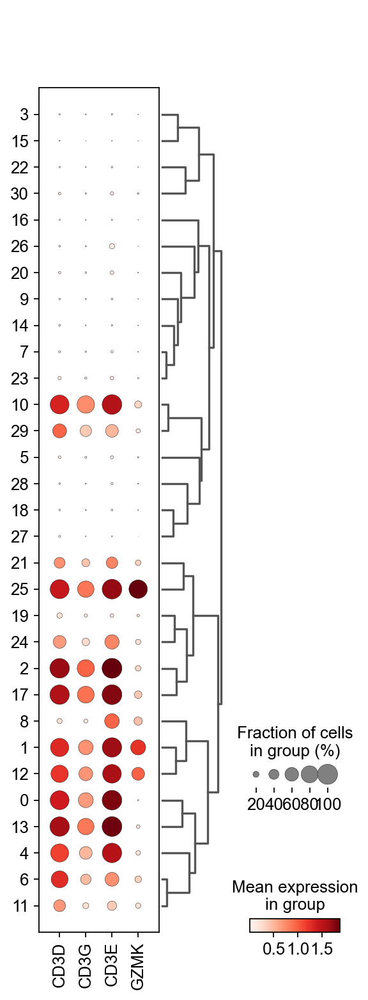

In [9]:
Tcell_geneset = ['CD3D','CD3G','CD3E','GZMK'] # T cell
sc.pl.dotplot(adata, Tcell_geneset , 'leiden', dendrogram=True)
#T cell '10','29','21','25','24','2','17','8','1','12','0','13','4','6','11'

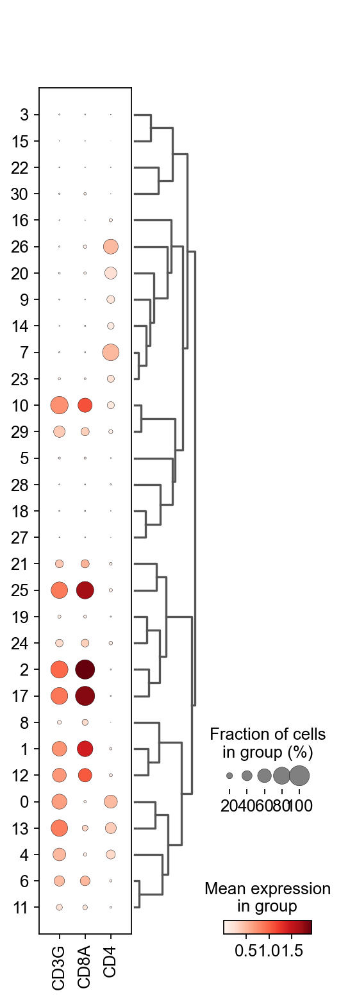

In [11]:
Tcell_geneset_1 = ['CD3G','CD8A','CD4'] # T cell
sc.pl.dotplot(adata, Tcell_geneset_1 , 'leiden', dendrogram=True)
#CD8 T cell '10','29','21','25','24','2','17','1','12','6'
#CD4 T cell '0','13','4'

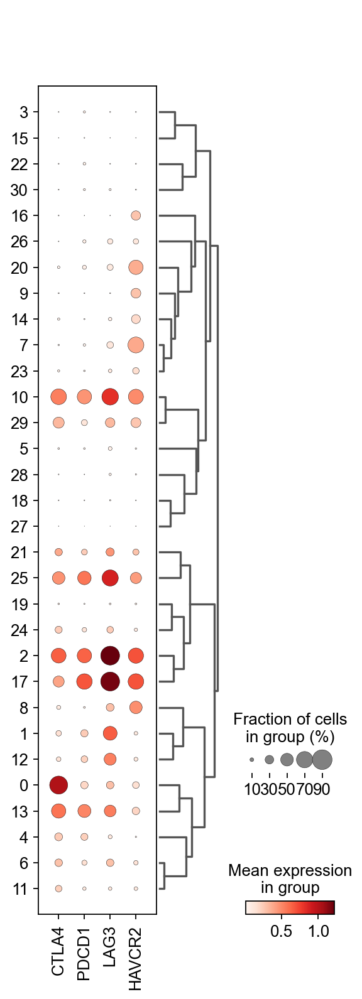

In [12]:
Texcell_geneset = ['CTLA4','PDCD1','LAG3','HAVCR2'] # exhausted T cell
sc.pl.dotplot(adata, Texcell_geneset , 'leiden', dendrogram=True)
#T exhausted cell '10','29','21','25','2','17',''


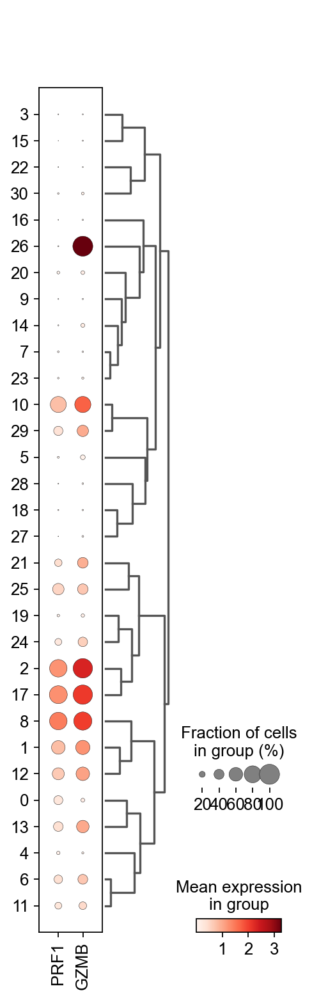

In [13]:
Teffcell_geneset = ['PRF1','GZMB'] # effector T cell
sc.pl.dotplot(adata, Teffcell_geneset , 'leiden', dendrogram=True)
#T effector cell '10','29','21','25','24','2','17','8','1','12','13'

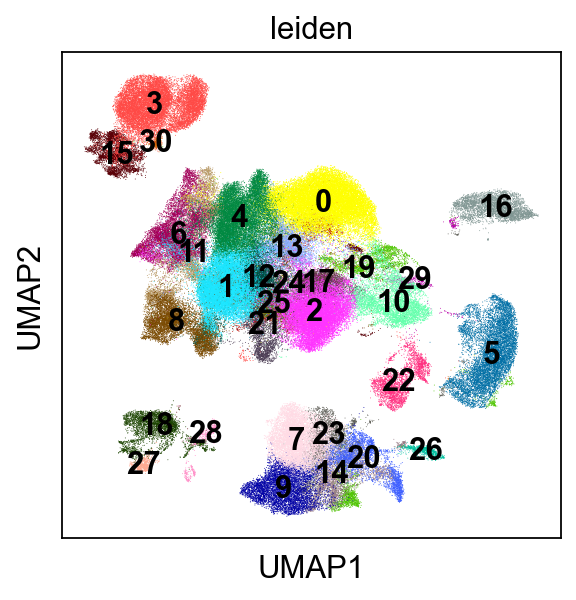

In [14]:
sc.pl.umap(adata, color=['leiden'],legend_loc='on data')

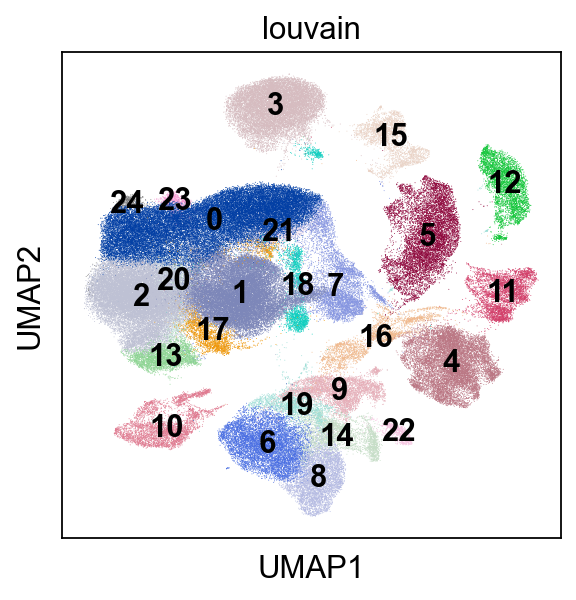

In [131]:
# previous one
#sc.pl.umap(adata, color=['louvain'],legend_loc='on data')

In [ ]:
#T cell '10','29','21','25','24','2','17','8','1','12','0','13','4','6','11'
#CD8 T cell '10','29','21','25','24','2','17','1','12','6'
#CD4 T cell '0','13','4'
#T exhausted cell '10','29','21','25','2','17',''
#T effector cell '10','29','21','25','24','2','17','8','1','12','13'

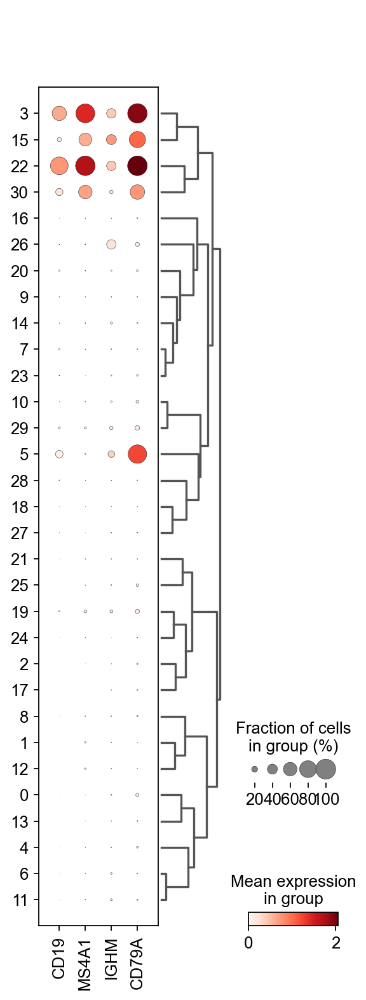

In [16]:
Bcell_geneset =['CD19','MS4A1','IGHM','CD79A'] # B cell
sc.pl.dotplot(adata, Bcell_geneset , 'leiden', dendrogram=True)
#B cell '3','15','22','30','5'

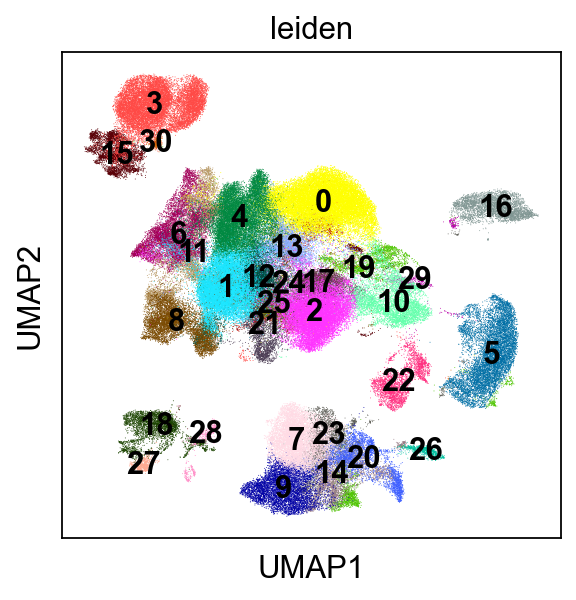

In [14]:
sc.pl.umap(adata, color=['leiden'],legend_loc='on data')

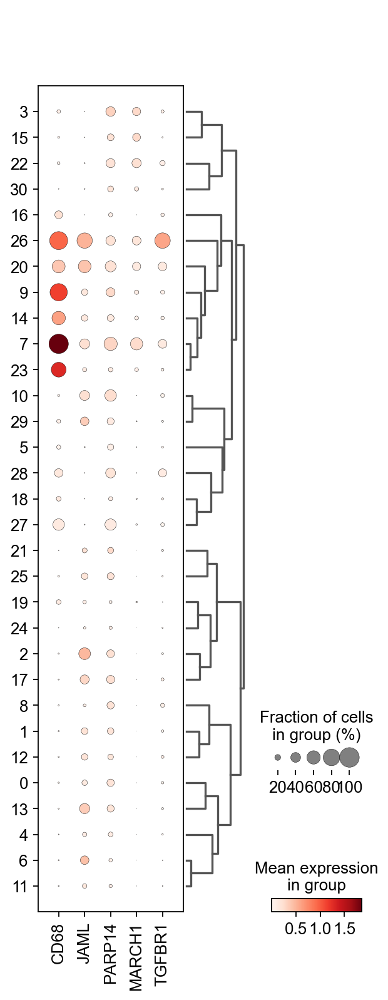

In [18]:
Mac_geneset =['CD68','JAML','PARP14','MARCH1','TGFBR1'] # Macrophage
sc.pl.dotplot(adata, Mac_geneset , 'leiden', dendrogram=True)
#Macro   '26','20','9','14','7','23'

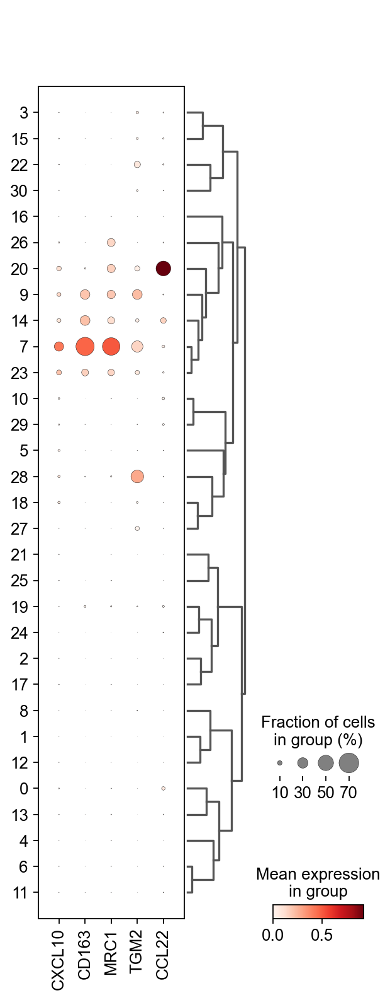

In [19]:
# M1_Macrophage : 'CD64', 'IDO', 'SOCS1', 'CXCL10','CD163'
# M2_Macrophage : 'MRC1', 'TGM2', 'CD23', 'CCL22'
Mac1_geneset =['CXCL10','CD163','MRC1', 'TGM2', 'CCL22'] # M1_Macrophage
sc.pl.dotplot(adata, Mac1_geneset , 'leiden', dendrogram=True)
#M1 Macro  '14'
#M2 Macro  '26','20'


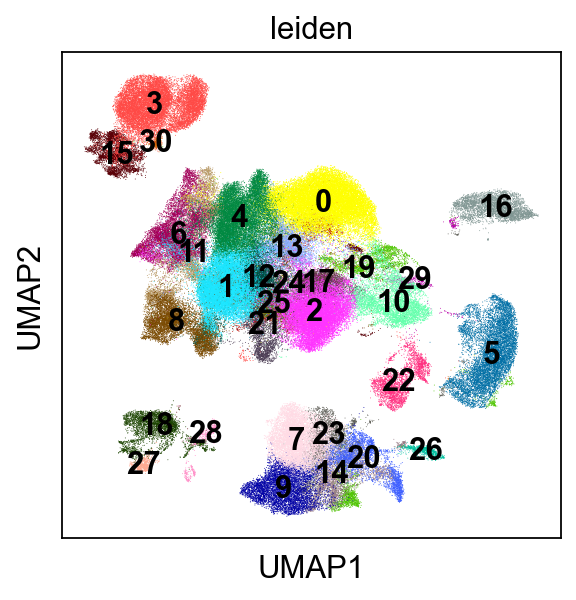

In [14]:
sc.pl.umap(adata, color=['leiden'],legend_loc='on data')

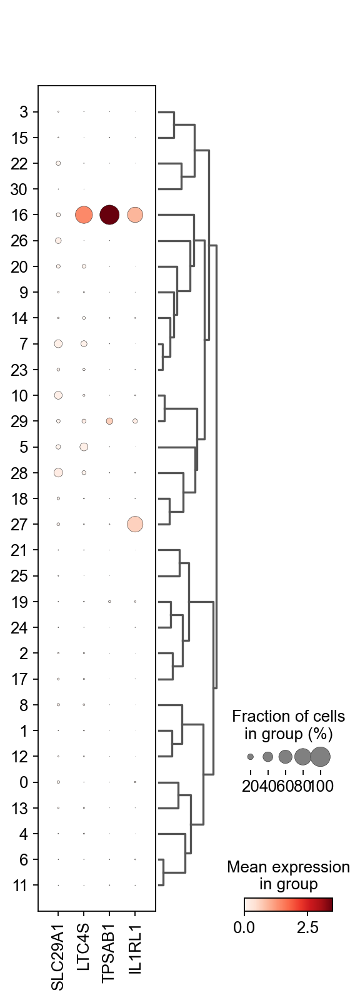

In [20]:
Mast_geneset =['SLC29A1','LTC4S','TPSAB1','IL1RL1'] # Mast cell
sc.pl.dotplot(adata, Mast_geneset , 'leiden', dendrogram=True)
#Mast cell'16'

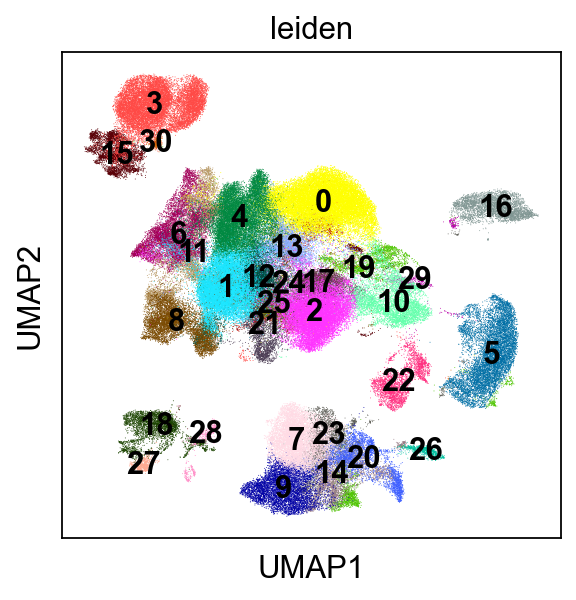

In [14]:
sc.pl.umap(adata, color=['leiden'],legend_loc='on data')

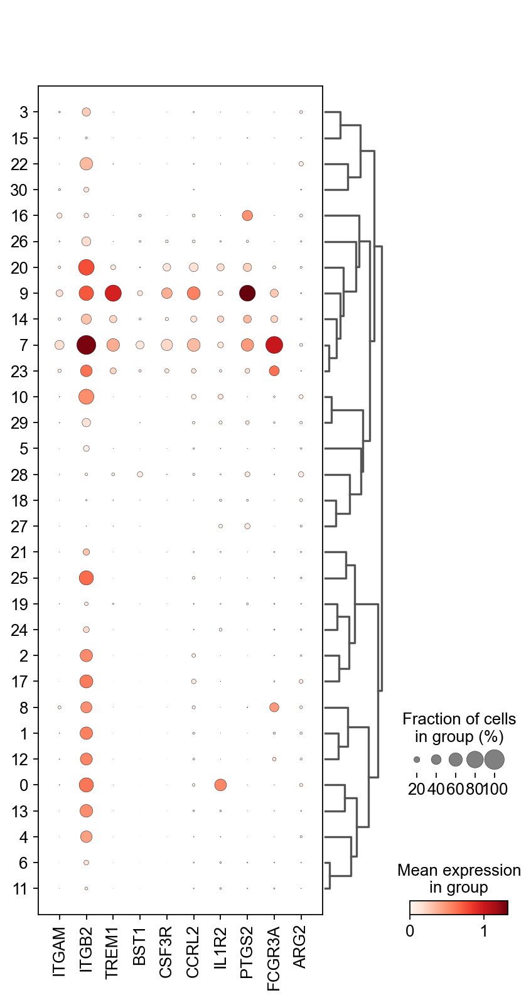

In [22]:
Neutro_geneset =['ITGAM','ITGB2','TREM1','BST1','CSF3R','CCRL2','IL1R2','PTGS2','FCGR3A','ARG2'] # Neutrophils
sc.pl.dotplot(adata, Neutro_geneset , 'leiden', dendrogram=True)
#Neutrophil ''

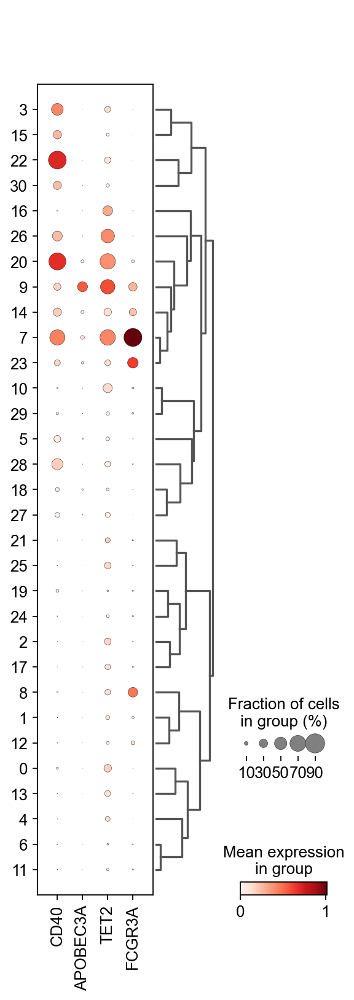

In [24]:
Mono_geneset =['CD40','APOBEC3A','TET2','FCGR3A'] #Monocyte
sc.pl.dotplot(adata, Mono_geneset , 'leiden', dendrogram=True)
#Monocyte '7','9','20','26'

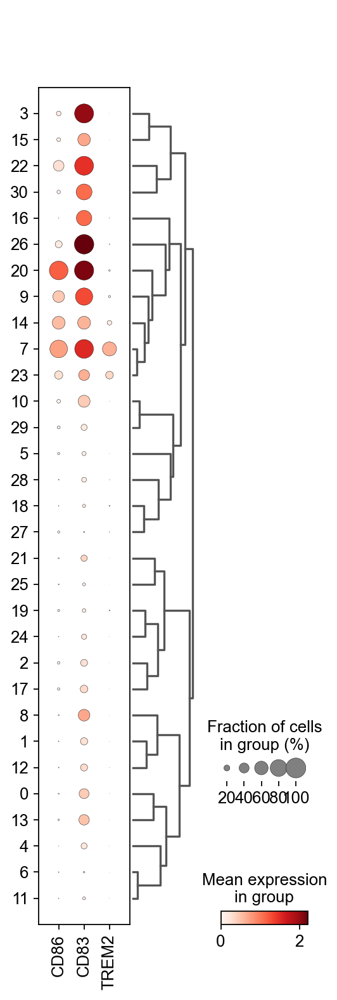

In [28]:
DC_geneset =['CD86','CD83','TREM2'] #Monocyte
sc.pl.dotplot(adata, DC_geneset , 'leiden', dendrogram=True)
#DC 

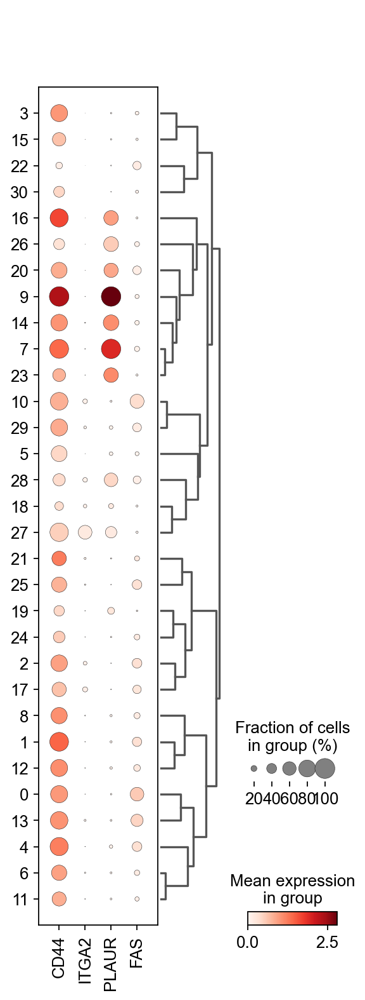

In [30]:
Fibro_geneset =['CD44','ITGA2','PLAUR','FAS'] #Monocyte
sc.pl.dotplot(adata, Fibro_geneset , 'leiden', dendrogram=True)
#Fibro

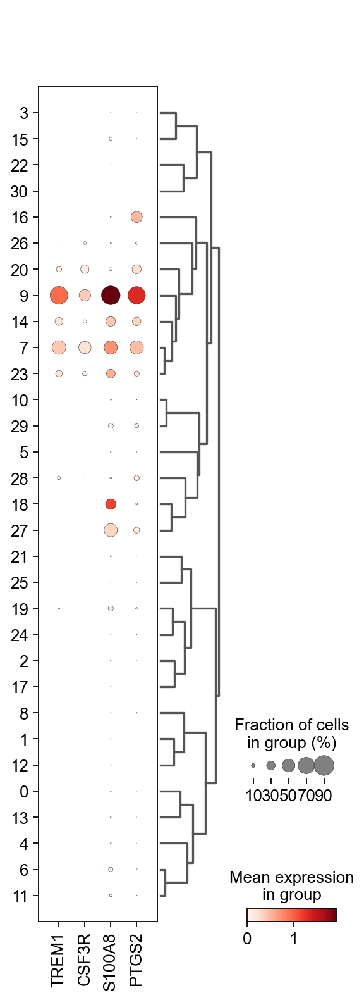

In [32]:
Neutro_geneset =['TREM1','CSF3R','S100A8','PTGS2'] 
sc.pl.dotplot(adata, Neutro_geneset , 'leiden', dendrogram=True)
#Neutrophil

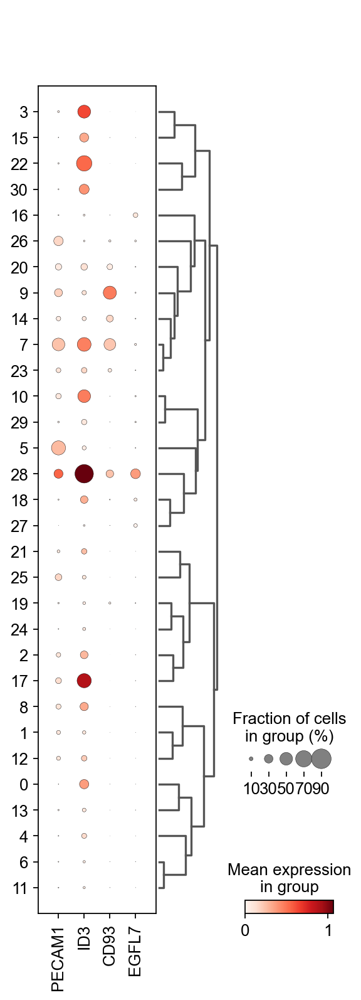

In [34]:
EC_geneset =['PECAM1','ID3','CD93','EGFL7'] 
sc.pl.dotplot(adata, EC_geneset , 'leiden', dendrogram=True)
#Endothelial '28'

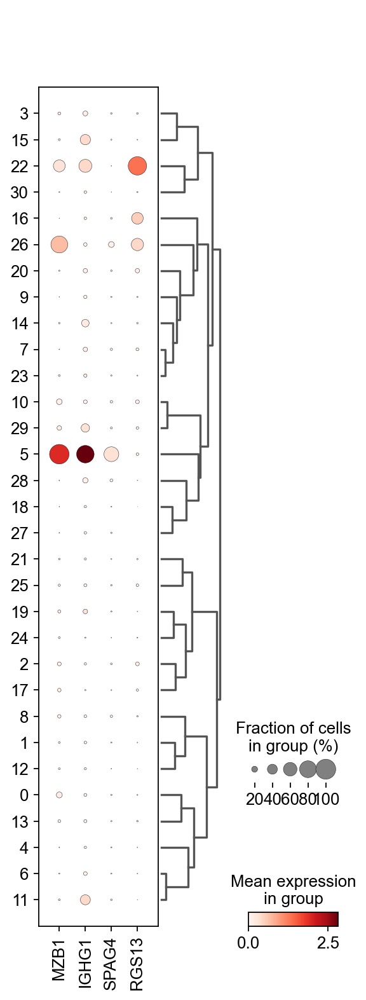

In [38]:
Plasma_geneset =['MZB1','IGHG1','SPAG4','RGS13'] 
sc.pl.dotplot(adata, Plasma_geneset , 'leiden', dendrogram=True)
#Plasma '22','5'

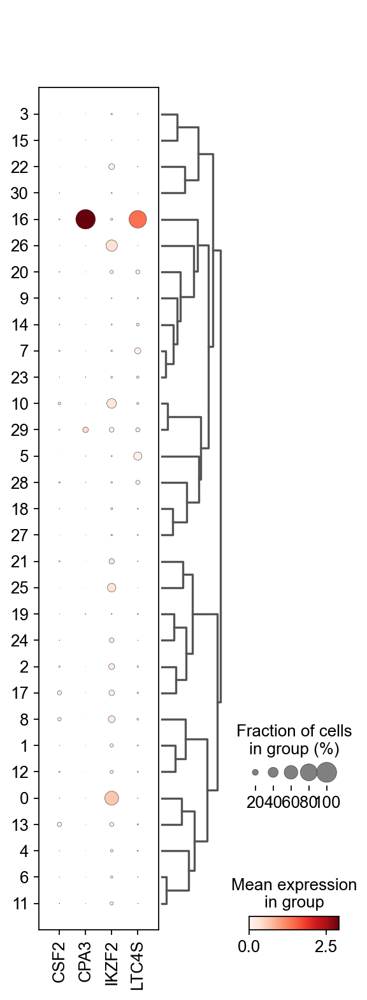

In [41]:
eosino_geneset =['CSF2','CPA3','IKZF2','LTC4S'] 
sc.pl.dotplot(adata, eosino_geneset , 'leiden', dendrogram=True)
#eosinophil '28'

In [ ]:
#T cell                                                            '10','29',                   '21','25','19','24','2','17','8','1','12','0','13','4','6','11'
#CD8 T cell                                                        '10','29',                   '21','25',    ,'24','2','17',    '1','12',             '6'
#CD4 T cell                                                                                                                               '0','13','4'
#T exhausted cell                                                  '10','29',                   '21','25',          '2','17'
#T effector cell                                                   '10','29',                   '21','25',     '24','2','17','8','1','12',    '13'
#B cell            '3','15',    '30',                                        
#Plasma cell                '22'                                               '5'
#Macro                                   '26','20','9','14','7','23'
#M1 Macro                                              '14'
#M2 Macro                                '26','20'
#Mast cell                           '16'
#Monocyte                                '26','20','9',     '7',
# unknown                                                                         '28','18','27'      
# unknown identification by PanglaoDB
#28 EC
#18 EC
#27 EC
# EC                                                                              '28','18','27' 

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:11:29)


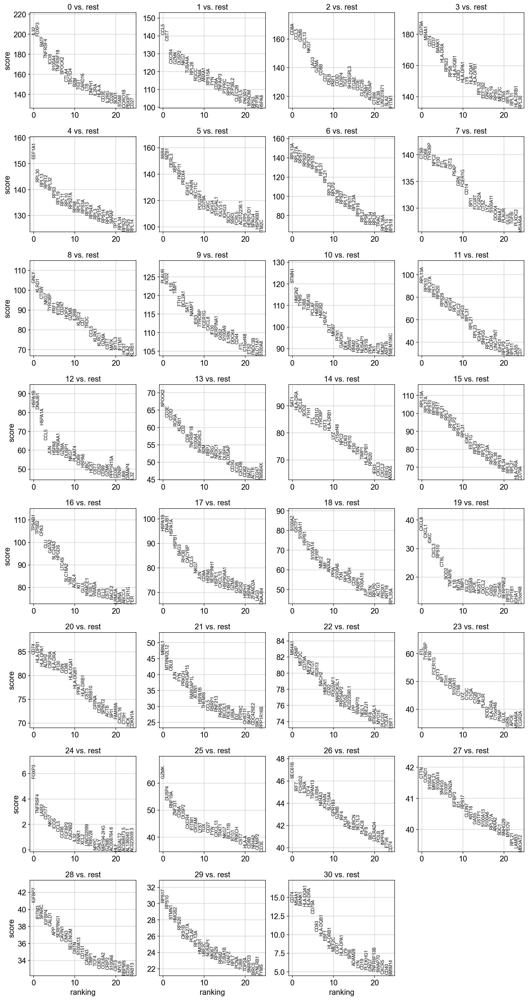

In [58]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

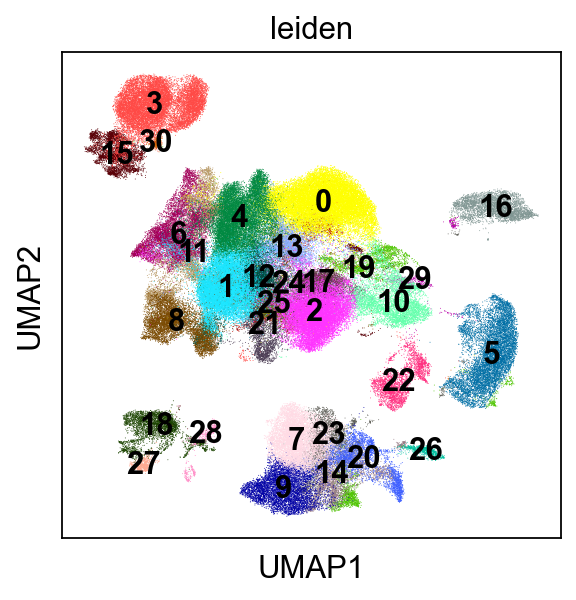

In [14]:
sc.pl.umap(adata, color=['leiden'],legend_loc='on data')

In [26]:
pd.crosstab(adata.obs['leiden'], adata.obs['patient'])
df = pd.crosstab(adata.obs['leiden'], adata.obs['patient'])
df.to_csv('leiden_patient_number.csv')
df

patient,P001,P002,P008,P009A,P009B,P010,P011,P012,P015,P016,...,P585,P658,P686,P787,P836,P846,P865,P866,P944,P986
leiden,,,,,,,,,,,,,,,,,,,,,
0,461,487,576,0,713,453,476,453,392,191,...,0,0,1,0,2,0,1,1,0,1
1,384,603,656,0,338,563,351,433,617,366,...,0,0,0,0,0,0,0,0,0,0
2,74,226,347,0,1089,97,340,38,245,3,...,0,0,0,0,0,1,0,0,0,0
3,204,447,220,0,69,105,144,322,66,2,...,0,0,0,0,0,0,0,0,0,0
4,290,468,532,0,187,201,185,395,305,117,...,0,0,0,0,0,0,0,0,0,0
5,472,251,35,0,194,286,105,422,247,256,...,12,2,0,0,2,0,0,8,1,0
6,0,0,0,0,0,3,1,0,0,0,...,510,1206,1462,9,1073,1955,921,24,64,844
7,80,105,268,0,459,827,100,28,90,138,...,1,0,0,1,1,0,0,0,0,4
8,36,30,247,0,56,40,126,182,321,39,...,0,0,0,0,0,0,0,2,0,0


In [42]:
adata.obs['celltype'] = adata.obs['leiden']

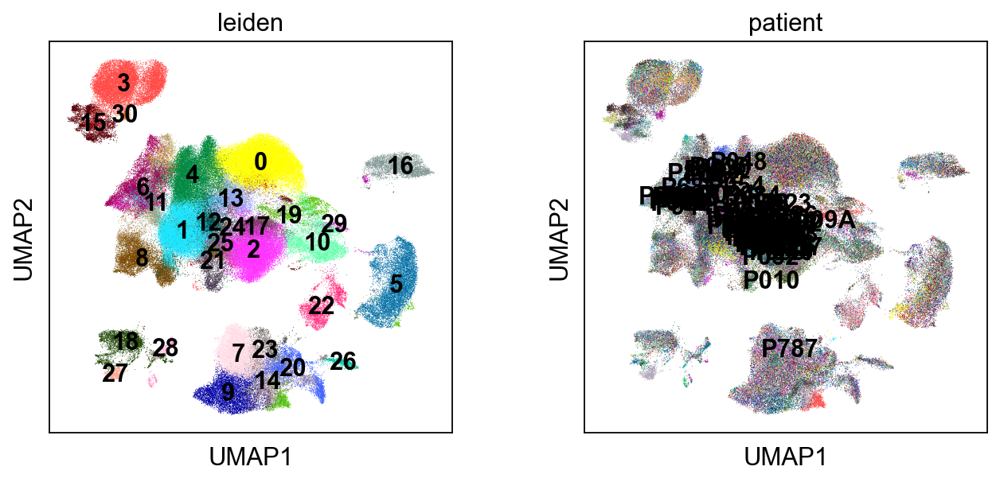

In [43]:
sc.pl.umap(adata, color=['leiden','patient'],legend_loc='on data')

In [154]:
#T cell                                                            '10','29',                   '21','25','19','24','2','17','8','1','12','0','13','4','6','11'
#CD8 T cell                                                        '10','29',                   '21','25',    ,'24','2','17',    '1','12',             '6'
#CD4 T cell                                                                                                                               '0','13','4'
#T exhausted cell                                                  '10','29',                   '21','25',          '2','17'
#T effector cell                                                   '10','29',                   '21','25',     '24','2','17','8','1','12',    '13'
#B cell            '3','15',    '30',                                        
#Plasma cell                '22'                                              '5'
#Macro                                   '26','20','9','14','7','23'
#M1 Macro                                              '14'
#M2 Macro                                '26','20'
#Mast cell                           '16'
#Monocyte                                '26','20','9',     '7',
# EC                                                                              '28','18','27' 


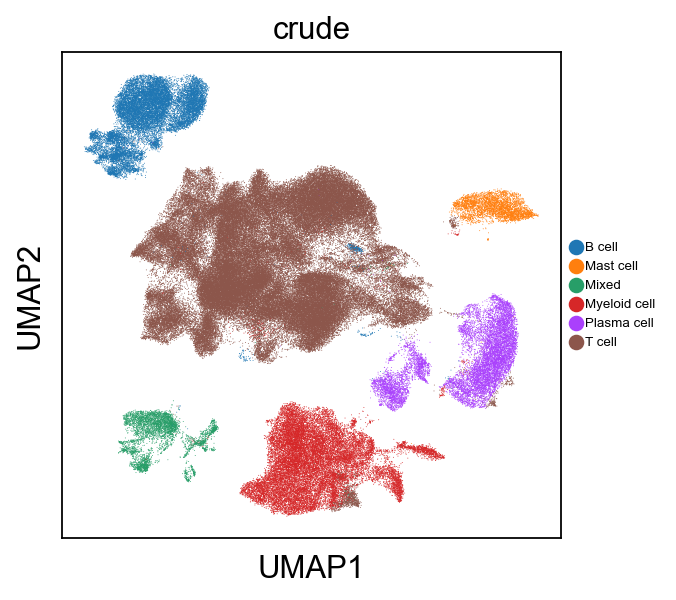

In [7]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'T cell': ['10','29',                   '21','25','19','24','2','17','8','1','12','0','13','4','6','11'],
             'B cell': ['3','15','30'],
             'Plasma cell': ['22','5'],
             'Myeloid cell': ['26','20','9','14','7','23'], 
              'Mast cell': ['16'],
             'Mixed': ['28','18','27'],}

# Initialize empty column in cell metadata
adata.obs['crude'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs.leiden).isin(cell_dict[i])
    adata.obs.loc[ind,'crude'] = i

sc.pl.umap(adata, color=['crude'], legend_loc='right margin', legend_fontsize=6, save='umap_crude_cluster.pdf')


In [47]:
adata.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,leiden,batch,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,celltype,crude
AAACCTGAGTAGCCGA-1-0-0,3934.0,3879,1452.073242,18.802568,1.294877,tumor,P686,6,0,198.197769,13.649295,0.000000,0.000000,0.012949,1452.073242,6,T cell
AAACCTGCAAGAGGCT-1-0-0,674.0,669,882.995728,11.229170,1.271713,tumor,P686,6,0,213.666718,24.197933,0.000000,0.000000,0.012717,882.995728,6,T cell
AAACCTGCAGTATCTG-1-0-0,1014.0,1003,956.411804,18.788149,1.964441,tumor,P686,6,0,221.148575,23.122736,0.000000,0.000000,0.019644,956.411804,6,T cell
AAACCTGCATGCCTTC-1-0-0,2607.0,2556,1262.646240,23.060396,1.826355,tumor,P686,14,0,161.333832,12.777437,0.000000,0.000000,0.018264,1262.646240,14,Myeloid cell
AAACCTGGTGCCTGGT-1-0-0,896.0,885,1091.559448,17.238060,1.579214,tumor,P686,6,0,176.360626,16.156759,0.000000,0.000000,0.015792,1091.559448,6,T cell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTCAAGCCATT-1-24-2,4456.0,4328,1867.209229,29.546848,1.582407,tumor,P001,0,2,172.502136,9.238501,0.172559,0.009242,0.015824,1867.209229,0,T cell
TTTGGTTGTCACCCAG-1-24-2,689.0,642,487.017822,17.679008,3.630054,tumor,P001,5,2,59.435638,12.203997,0.000000,0.000000,0.036301,487.017822,5,Plasma cell
TTTGTCAAGCGCTTAT-1-24-2,248.0,235,523.794067,8.050291,1.536919,tumor,P001,5,2,57.140697,10.909000,0.000000,0.000000,0.015369,523.794067,5,Plasma cell
TTTGTCAGTCCTCTTG-1-24-2,2711.0,2644,1972.602417,24.433256,1.238631,tumor,P001,10,2,120.637726,6.115664,0.000000,0.000000,0.012386,1972.602417,10,T cell


In [48]:
adata.obs['patient']

AAACCTGAGTAGCCGA-1-0-0     P686
AAACCTGCAAGAGGCT-1-0-0     P686
AAACCTGCAGTATCTG-1-0-0     P686
AAACCTGCATGCCTTC-1-0-0     P686
AAACCTGGTGCCTGGT-1-0-0     P686
                           ... 
TTTGGTTCAAGCCATT-1-24-2    P001
TTTGGTTGTCACCCAG-1-24-2    P001
TTTGTCAAGCGCTTAT-1-24-2    P001
TTTGTCAGTCCTCTTG-1-24-2    P001
TTTGTCAGTCTCTTTA-1-24-2    P001
Name: patient, Length: 177304, dtype: category
Categories (69, object): ['P001', 'P002', 'P008', 'P009A', ..., 'P865', 'P866', 'P944', 'P986']

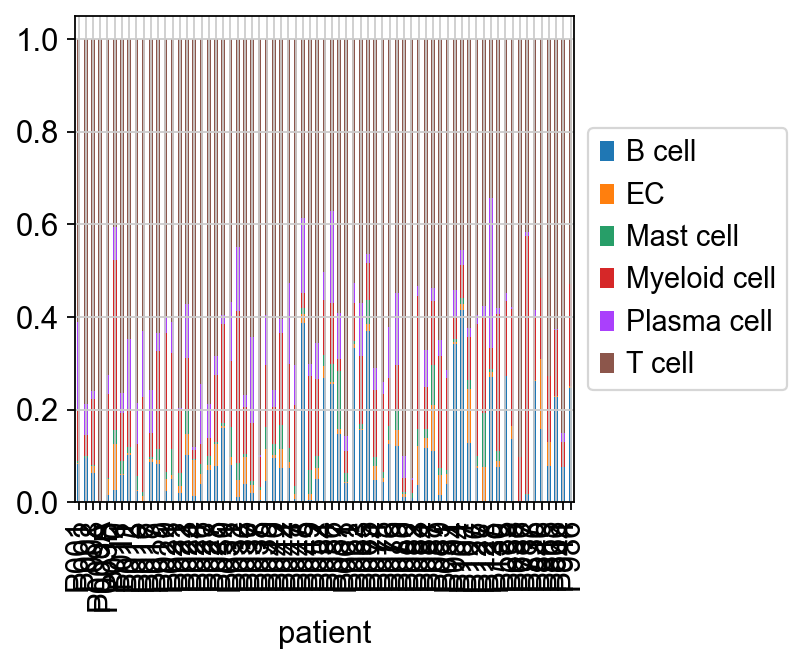

In [49]:
tmp = pd.crosstab(adata.obs['patient'],adata.obs['crude'], normalize='index')
ax = tmp.plot.bar(stacked=True).legend(loc='center left', bbox_to_anchor=(1.0, 0.5)).get_figure()

ax.savefig('all_immune_cell_stacked_bar.pdf')

In [154]:
#T cell                                                            '10','29',                   '21','25','19','24','2','17','8','1','12','0','13','4','6','11'
#CD8 T cell                                                        '10','29',                   '21','25',    ,'24','2','17',    '1','12',             '6'
#CD4 T cell                                                                                                                               '0','13','4'
#T exhausted cell                                                  '10','29',                   '21','25',          '2','17'
#T effector cell                                                   '10','29',                   '21','25',     '24','2','17','8','1','12',    '13'
#B cell            '3','15',    '30',                                        
#Plasma cell                '22'                                              '5'
#Macro                                   '26','20','9','14','7','23'
#M1 Macro                                              '14'
#M2 Macro                                '26','20'
#Mast cell                           '16'
#Monocyte                                '26','20','9',     '7',
# EC                                                                              '28','18','27' 


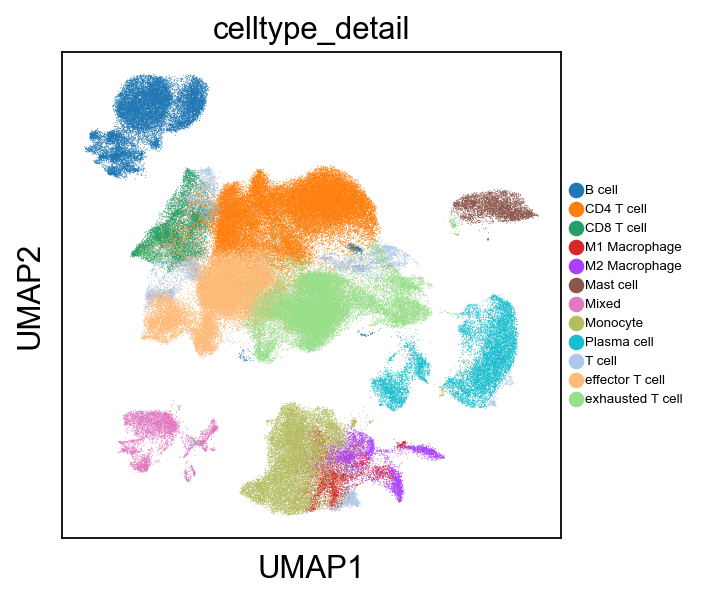

In [7]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'CD4 T cell':      [                                                                       '0','13','4'],
             'CD8 T cell':      [                                                                                    '6'],
             'exhausted T cell':['10','29',                   '21','25',          '2','17'],
             'effector T cell': [                                            '24',         '8','1','12',    ],
             'T cell':          [                                       '19',                                            '11'],
             
           
             'Monocyte':        [         '9',     '7','23'],
             
             'M1 Macrophage':   [              '14'],
             'M2 Macrophage':   ['26','20'],
             
             'B cell':           ['3','15','30'],
             'Plasma cell':      ['22','5'],
             'Mast cell':        ['16'],
            'Mixed':                ['28','18','27']
            
            }

# Initialize empty column in cell metadata
adata.obs['celltype_detail'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs.leiden).isin(cell_dict[i])
    adata.obs.loc[ind,'celltype_detail'] = i

sc.pl.umap(adata, color=['celltype_detail'], legend_loc='right margin', legend_fontsize=6, save='umap_celltype_detail_cluster.pdf')


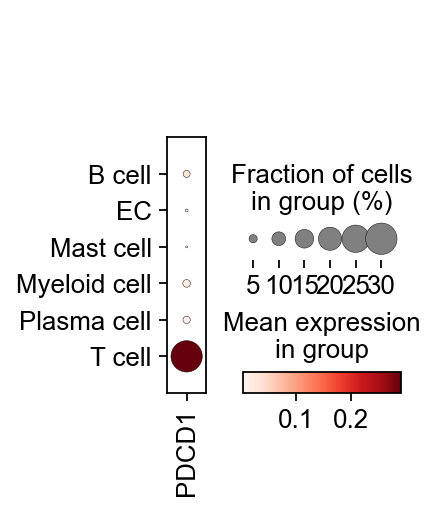

In [70]:
sc.pl.dotplot(adata, ['PDCD1'] , groupby='crude')

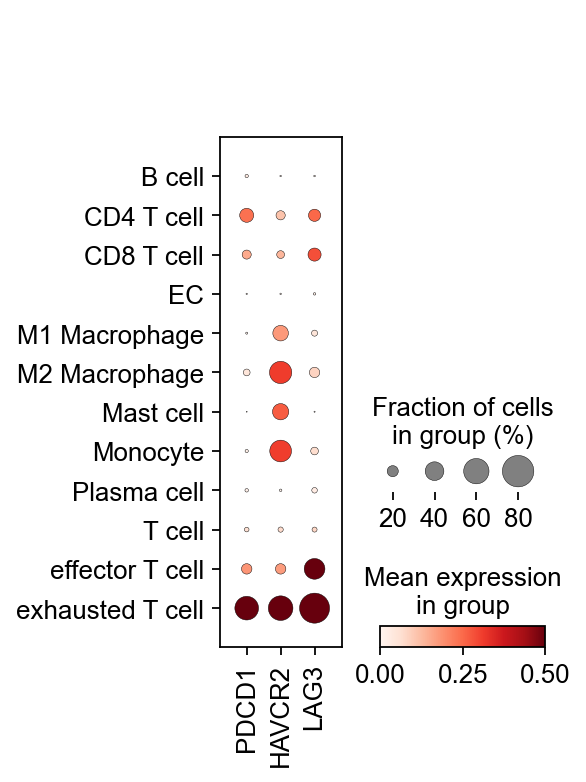

In [71]:
sc.pl.dotplot(adata, ['PDCD1','HAVCR2','LAG3'],vmin=0, vmax=0.5 , groupby='celltype_detail',save='dotplot_exT_marker_celltype_detail.pdf')

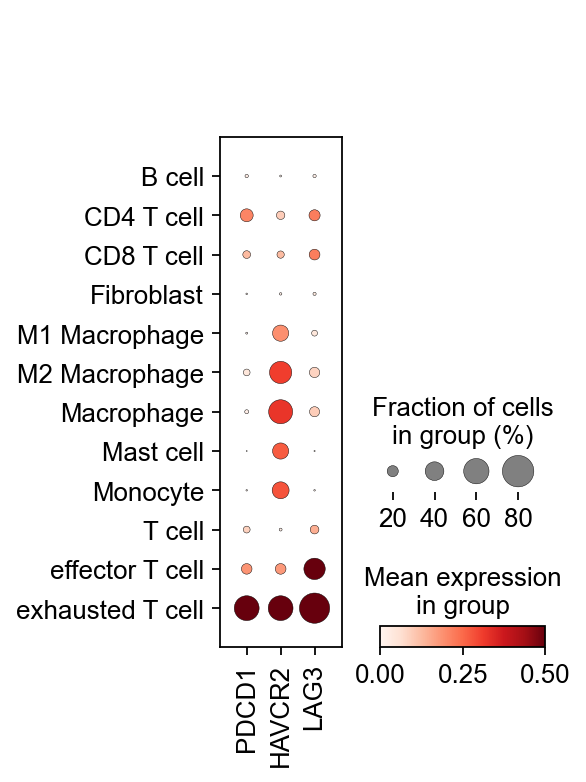

In [172]:
# previous one
#sc.pl.dotplot(adata, ['PDCD1','HAVCR2','LAG3'],vmin=0, vmax=0.5 , groupby='celltype_detail',save='dotplot_exT_marker_celltype_detail.pdf')

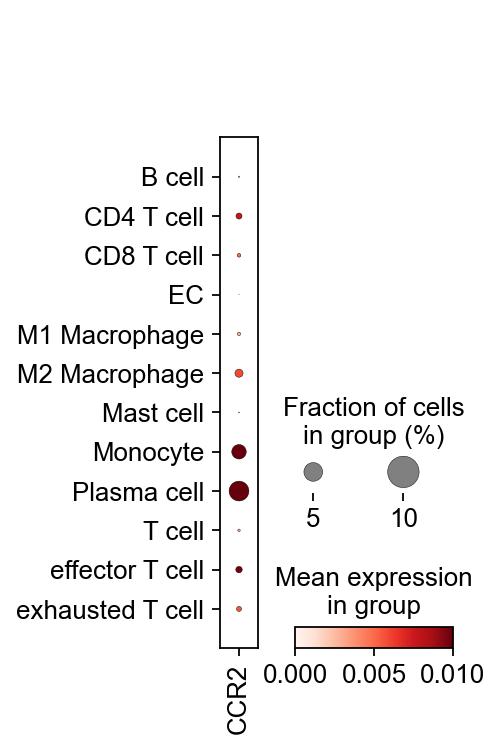

In [55]:
sc.pl.dotplot(adata, ['CCR2'],vmin=-0, vmax=0.01  , groupby='celltype_detail' ,save='dotplot_CCR2_celltype_detail.pdf')

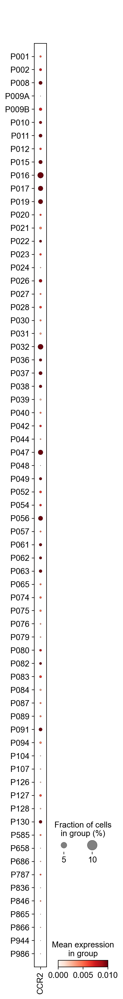

In [56]:
sc.pl.dotplot(adata, ['CCR2'],vmin=-0, vmax=0.01  , groupby='patient' ,save='dotplot_CCR2_patient.pdf')

In [57]:
# Patient groups from tumor cell analysis of 03-07-23
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = { 'Group A': ["P061",	"P094",	"P001",	"P080",	"P024",	"P036",	"P042",	"P082",	"P104",	"P056",	"P063",	"P009A",	"P866",	"P787",	"P986",	"P836",	"P658",	"P686",	"P944",	"P087",	"P039",	"P048",	"P038",	"P126",	"P585",	"P865",	"P846",	"P089",	"P107",	"P083",	"P074"
],
             'Group B': ["P010",	"P130",	"P015",	"P030",	"P049",	"P032",	"P037",	"P017",	"P020",	"P023",	"P019",	"P021",	"P011",	"P084",	"P091",	"P009B",	"P075",	"P057",	"P065",	"P008",	"P008"
],
             'Group C': ["P028",	"P052",	"P012",	"P027",	"P026",	"P128",	"P031",	"P054",	"P062",	"P127",	"P079",	"P076",	"P002",	"P016",	"P040",	"P047",	"P022",	"P044"
]}

# Initialize empty column in cell metadata
adata.obs['patient_cluster'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs.patient).isin(cell_dict[i])
    adata.obs.loc[ind,'patient_cluster'] = i

#sc.pl.pca(adata, color=['patient_cluster_modified'], legend_loc='right margin', legend_fontsize=6)

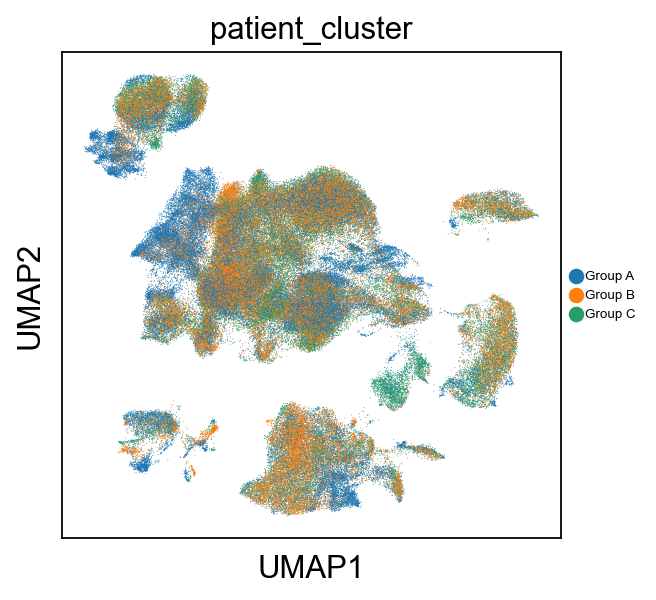

In [59]:
sc.pl.umap(adata, color=['patient_cluster'], legend_loc='right margin', legend_fontsize=6, save='umap_immune_patient_cluster.pdf')

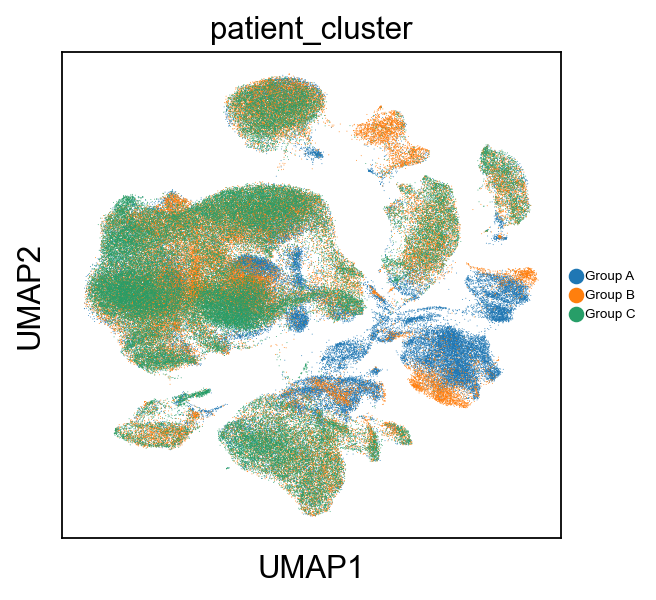

In [202]:
# previous one
#sc.pl.umap(adata, color=['patient_cluster'], legend_loc='right margin', legend_fontsize=6)#, save='umap_immune_louvain_patient_cluster.pdf')

In [60]:
adata.obs.patient_cluster = adata.obs.patient_cluster.astype('category')

In [61]:
adata_a = adata[adata.obs['patient_cluster']=='Group A']
adata_b = adata[adata.obs['patient_cluster']=='Group B']
adata_c = adata[adata.obs['patient_cluster']=='Group C']

In [62]:
adata_c.obs['patient']

AAACCTGCACGGCCAT-1-16-0    P044
AAACCTGCAGTCGATT-1-16-0    P044
AAACCTGCATTGTGCA-1-16-0    P044
AAACCTGGTATTCGTG-1-16-0    P044
AAACCTGGTCCGTTAA-1-16-0    P044
                           ... 
TTTGGTTGTTGGTGGA-1-23-1    P076
TTTGGTTTCACCTTAT-1-23-1    P076
TTTGGTTTCGCCGTGA-1-23-1    P076
TTTGGTTTCTCGCATC-1-23-1    P076
TTTGTCAAGTGTGAAT-1-23-1    P076
Name: patient, Length: 55258, dtype: category
Categories (18, object): ['P002', 'P012', 'P016', 'P022', ..., 'P076', 'P079', 'P127', 'P128']

In [8]:
adata.write('Immune_Group_ABC_after_celltype_clustering.h5ad')

In [6]:
adata = sc.read('Immune_Group_ABC_after_celltype_clustering.h5ad')

In [7]:
# loading data made from 3 T cell classes and 3 Myeloid cell classes
# adata = sc.read('F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell/GroupABC_integrated/Group_ABC_after_celltype_clustering.h5ad')

In [66]:
adata.obs['patient']

AAACCTGAGTAGCCGA-1-0-0     P686
AAACCTGCAAGAGGCT-1-0-0     P686
AAACCTGCAGTATCTG-1-0-0     P686
AAACCTGCATGCCTTC-1-0-0     P686
AAACCTGGTGCCTGGT-1-0-0     P686
                           ... 
TTTGGTTCAAGCCATT-1-24-2    P001
TTTGGTTGTCACCCAG-1-24-2    P001
TTTGTCAAGCGCTTAT-1-24-2    P001
TTTGTCAGTCCTCTTG-1-24-2    P001
TTTGTCAGTCTCTTTA-1-24-2    P001
Name: patient, Length: 177304, dtype: category
Categories (69, object): ['P001', 'P002', 'P008', 'P009A', ..., 'P865', 'P866', 'P944', 'P986']

In [67]:
P009A_imn = adata[adata.obs['patient']=='P009A']
P036_imn = adata[adata.obs['patient']=='P036']
P126_imn = adata[adata.obs['patient']=='P126']
P038_imn = adata[adata.obs['patient']=='P038']
P104_imn = adata[adata.obs['patient']=='P104']
P082_imn = adata[adata.obs['patient']=='P082']
P063_imn = adata[adata.obs['patient']=='P063']
P056_imn = adata[adata.obs['patient']=='P056']
P866_imn = adata[adata.obs['patient']=='P866']
P686_imn = adata[adata.obs['patient']=='P686']
P658_imn = adata[adata.obs['patient']=='P658']
P787_imn = adata[adata.obs['patient']=='P787']
P986_imn = adata[adata.obs['patient']=='P986']
P585_imn = adata[adata.obs['patient']=='P585']
P944_imn = adata[adata.obs['patient']=='P944']
P865_imn = adata[adata.obs['patient']=='P865']
P087_imn = adata[adata.obs['patient']=='P087']
P047_imn = adata[adata.obs['patient']=='P047']
P040_imn = adata[adata.obs['patient']=='P040']
P044_imn = adata[adata.obs['patient']=='P044']
P022_imn = adata[adata.obs['patient']=='P022']

P048_imn = adata[adata.obs['patient']=='P048']
P039_imn = adata[adata.obs['patient']=='P039']
P127_imn = adata[adata.obs['patient']=='P127']
P054_imn = adata[adata.obs['patient']=='P054']
P016_imn = adata[adata.obs['patient']=='P016']
P002_imn = adata[adata.obs['patient']=='P002']
P128_imn = adata[adata.obs['patient']=='P128']
P031_imn = adata[adata.obs['patient']=='P031']
P026_imn = adata[adata.obs['patient']=='P026']
P012_imn = adata[adata.obs['patient']=='P012']
P027_imn = adata[adata.obs['patient']=='P027']
P079_imn = adata[adata.obs['patient']=='P079']
P076_imn = adata[adata.obs['patient']=='P076']
P052_imn = adata[adata.obs['patient']=='P052']
P028_imn = adata[adata.obs['patient']=='P028']
P080_imn = adata[adata.obs['patient']=='P080']
P062_imn = adata[adata.obs['patient']=='P062']
P846_imn = adata[adata.obs['patient']=='P846']
P836_imn = adata[adata.obs['patient']=='P836']
P107_imn = adata[adata.obs['patient']=='P107']
P089_imn = adata[adata.obs['patient']=='P089']
P083_imn = adata[adata.obs['patient']=='P083']
P074_imn = adata[adata.obs['patient']=='P074']

P130_imn = adata[adata.obs['patient']=='P130']
P010_imn = adata[adata.obs['patient']=='P010']
P030_imn = adata[adata.obs['patient']=='P030']
P015_imn = adata[adata.obs['patient']=='P015']
P049_imn = adata[adata.obs['patient']=='P049']
P037_imn = adata[adata.obs['patient']=='P037']
P032_imn = adata[adata.obs['patient']=='P032']
P075_imn = adata[adata.obs['patient']=='P075']
P009B_imn = adata[adata.obs['patient']=='P009B']
P021_imn = adata[adata.obs['patient']=='P021']
P019_imn = adata[adata.obs['patient']=='P019']
P084_imn = adata[adata.obs['patient']=='P084']
P011_imn = adata[adata.obs['patient']=='P011']
P091_imn = adata[adata.obs['patient']=='P091']
P065_imn = adata[adata.obs['patient']=='P065']
P057_imn = adata[adata.obs['patient']=='P057']
P008_imn = adata[adata.obs['patient']=='P008']
P042_imn = adata[adata.obs['patient']=='P042']
P024_imn = adata[adata.obs['patient']=='P024']
P020_imn = adata[adata.obs['patient']=='P020']
P017_imn = adata[adata.obs['patient']=='P017']
P023_imn = adata[adata.obs['patient']=='P023']
P094_imn = adata[adata.obs['patient']=='P094']
P061_imn = adata[adata.obs['patient']=='P061']
P001_imn = adata[adata.obs['patient']=='P001']

In [68]:
P009A_imn.write('P009A_imn.h5ad')
P036_imn.write('P036_imn.h5ad')
P126_imn.write('P126_imn.h5ad')
P038_imn.write('P038_imn.h5ad')
P104_imn.write('P104_imn.h5ad')
P082_imn.write('P082_imn.h5ad')
P063_imn.write('P063_imn.h5ad')
P056_imn.write('P056_imn.h5ad')
P866_imn.write('P866_imn.h5ad')
P686_imn.write('P686_imn.h5ad')
P658_imn.write('P658_imn.h5ad')
P787_imn.write('P787_imn.h5ad')
P986_imn.write('P986_imn.h5ad')
P585_imn.write('P585_imn.h5ad')
P944_imn.write('P944_imn.h5ad')
P865_imn.write('P865_imn.h5ad')
P087_imn.write('P087_imn.h5ad')
P047_imn.write('P047_imn.h5ad')
P040_imn.write('P040_imn.h5ad')
P044_imn.write('P044_imn.h5ad')
P022_imn.write('P022_imn.h5ad')

P048_imn.write('P048_imn.h5ad')
P039_imn.write('P039_imn.h5ad')
P127_imn.write('P127_imn.h5ad')
P054_imn.write('P054_imn.h5ad')
P016_imn.write('P016_imn.h5ad')
P002_imn.write('P002_imn.h5ad')
P128_imn.write('P128_imn.h5ad')
P031_imn.write('P031_imn.h5ad')
P026_imn.write('P026_imn.h5ad')
P012_imn.write('P012_imn.h5ad')
P027_imn.write('P027_imn.h5ad')
P079_imn.write('P079_imn.h5ad')
P076_imn.write('P076_imn.h5ad')
P052_imn.write('P052_imn.h5ad')
P028_imn.write('P028_imn.h5ad')
P080_imn.write('P080_imn.h5ad')
P062_imn.write('P062_imn.h5ad')
P846_imn.write('P846_imn.h5ad')
P836_imn.write('P836_imn.h5ad')
P107_imn.write('P107_imn.h5ad')
P089_imn.write('P089_imn.h5ad')
P083_imn.write('P083_imn.h5ad')
P074_imn.write('P074_imn.h5ad')

P130_imn.write('P130_imn.h5ad')
P010_imn.write('P010_imn.h5ad')
P030_imn.write('P030_imn.h5ad')
P015_imn.write('P015_imn.h5ad')
P049_imn.write('P049_imn.h5ad')
P037_imn.write('P037_imn.h5ad')
P032_imn.write('P032_imn.h5ad')
P075_imn.write('P075_imn.h5ad')
P009B_imn.write('P009B_imn.h5ad')
P021_imn.write('P021_imn.h5ad')
P019_imn.write('P019_imn.h5ad')
P084_imn.write('P084_imn.h5ad')
P011_imn.write('P011_imn.h5ad')
P091_imn.write('P091_imn.h5ad')
P065_imn.write('P065_imn.h5ad')
P057_imn.write('P057_imn.h5ad')
P008_imn.write('P008_imn.h5ad')
P042_imn.write('P042_imn.h5ad')
P024_imn.write('P024_imn.h5ad')
P020_imn.write('P020_imn.h5ad')
P017_imn.write('P017_imn.h5ad')
P023_imn.write('P023_imn.h5ad')
P094_imn.write('P094_imn.h5ad')
P061_imn.write('P061_imn.h5ad')
P001_imn.write('P001_imn.h5ad')

In [64]:
adata

AnnData object with n_obs × n_vars = 177304 × 12499
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'leiden', 'batch', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'celltype', 'crude', 'celltype_detail', 'patient_cluster'
    var: 'gene_ids', 'mt', 'feature_types-10', 'feature_types-11', 'feature_types-12', 'feature_types-13', 'feature_types-14', 'feature_types-15', 'feature_types-16', 'feature_types-17', 'feature_types-18', 'feature_types-19', 'feature_types-20', 'feature_types-21', 'feature_types-3', 'feature_types-4', 'feature_types-5', 'feature_types-6', 'feature_types-7', 'feature_types-8', 'feature_types-9', 'feature_types-0', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'n_cells-1-0', 'n_cells_by_counts-1-0', 'mean_counts-1-0', 'pct_dropout_by_counts-1-0', 'total_counts-1-0', 'n_cells-10-0', 'n_

In [13]:
#previous one
#adata

AnnData object with n_obs × n_vars = 174486 × 12331
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'louvain', 'batch', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'celltype', 'crude', 'celltype_detail', 'patient_cluster', 'dataset'
    var: 'gene_ids', 'mt', 'feature_types-10', 'feature_types-11', 'feature_types-12', 'feature_types-13', 'feature_types-14', 'feature_types-15', 'feature_types-16', 'feature_types-17', 'feature_types-18', 'feature_types-19', 'feature_types-20', 'feature_types-21', 'feature_types-3', 'feature_types-4', 'feature_types-5', 'feature_types-6', 'feature_types-7', 'feature_types-8', 'feature_types-9', 'feature_types-0', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'n_cells-1-0', 'n_cells_by_counts-1-0', 'mean_counts-1-0', 'pct_dropout_by_counts-1-0', 'total_counts-1-0', 'n_cell

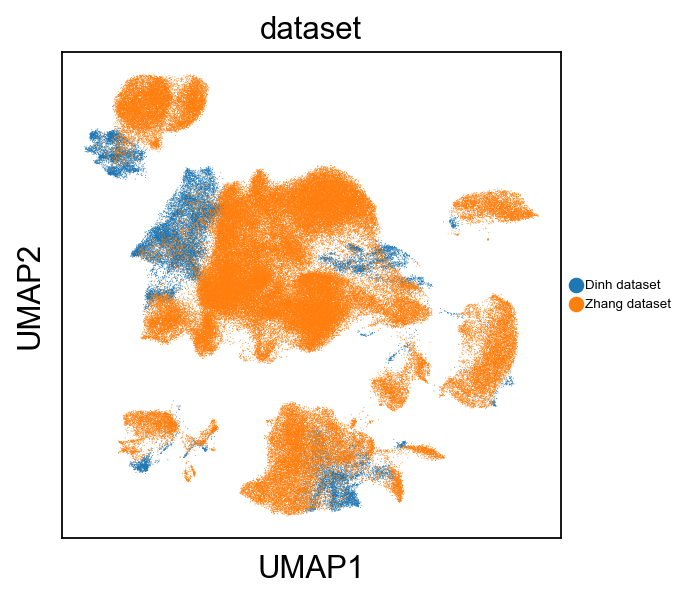

In [65]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'Zhang dataset': ["P001",	"P002",	"P004",	"P005",	"P008",	"P009B",	"P010",	"P011",	"P012",	"P015",	"P016",	"P017",	"P019",	"P020",	"P021",	"P022",	"P023",	"P024",	"P026",	"P027",	"P028",	"P030",	"P031",	"P032",	"P036",	"P037",	"P038",	"P039",	"P040",	"P042",	"P044",	"P047",	"P048",	"P049",	"P052",	"P054",	"P056",	"P057",	"P061",	"P062",	"P063",	"P065",	"P074",	"P075",	"P076",	"P079",	"P080",	"P082",	"P083",	"P084",	"P087",	"P089",	"P091",	"P094",	"P104",	"P107",	"P126",	"P127",	"P128",	"P130",
],
             'Dinh dataset': ["P009A",	"P585",	"P658",	"P686",	"P787",	"P836",	"P846",	"P865",	"P866",	"P944",	"P986",
],
             }

# Initialize empty column in cell metadata
adata.obs['dataset'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs.patient).isin(cell_dict[i])
    adata.obs.loc[ind,'dataset'] = i

sc.pl.umap(adata, color=['dataset'], legend_loc='right margin', legend_fontsize=6, save='umap_dataset_cluster.pdf')

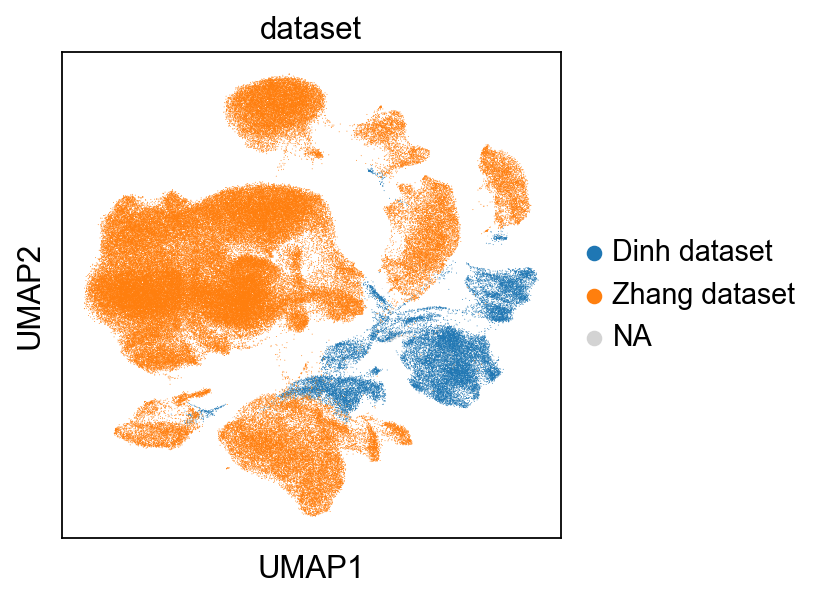

In [16]:
# previous one
#sc.pl.umap(adata, color=['dataset'])